In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [28]:
# Import libraries
import logging
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import time
import warnings
import shap
import joblib
import lime
from lime import lime_tabular
from lime import submodular_pick
import xgboost as xgb
from xgboost import XGBClassifier
from ltcn.LTCN import LTCN
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, RandomizedSearchCV,GridSearchCV, cross_validate
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler, LabelEncoder, RobustScaler
from sklearn.metrics import confusion_matrix, f1_score, make_scorer, classification_report, cohen_kappa_score, precision_score, recall_score, balanced_accuracy_score, accuracy_score, roc_curve, roc_auc_score
from sklearn.inspection import permutation_importance
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
import optuna
from optuna.visualization.matplotlib import plot_optimization_history


warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

## Supporting Function

In [2]:
 # Function to assess Model performance
def conf_matrix_classif_report(model, y_test, y_pred_val):
  """
  model : str variable with model name to be used for titles.
  y_test : Variable with True label list
  y_pred_val : Variable with Model predicted values.
  """

  # Target classes
  class_label = ['3','4','5']

  # Model primary metric: f1 macro score
  model_f1_macro_score= f1_score(y_test, y_pred_val, average='macro')
  print('')
  print(f"{model} f1 macro score: {model_f1_macro_score}")

  # Model support metric: precision macro score
  model_precision_macro_score = precision_score(y_test, y_pred_val, average='macro')
  print('')
  print(f"{model} precision macro score: {model_precision_macro_score}")

  # Model support metric: recall macro score
  model_recall_macro_score = recall_score(y_test, y_pred_val, average='macro')
  print('')
  print(f"{model} recall macro score: {model_recall_macro_score}")

   # Model support metric: balanced accuracy score
  model_balanced_accuracy_score= balanced_accuracy_score(y_test, y_pred_val)
  print('')
  print(f"{model} balanced accuracy score: {model_balanced_accuracy_score}")

   # Model support metric: accuracy score
  model_accuracy_score= accuracy_score(y_test, y_pred_val)
  print('')
  print(f"{model} accuracy score: {model_accuracy_score}")

  # Model support metric: cohen kappa score
  model_cohen_kappa_score= cohen_kappa_score(y_test, y_pred_val)
  print('')
  print(f"{model} cohen kappa score: {model_cohen_kappa_score}")

  # Classification report
  classif_report = classification_report(y_test, y_pred_val)
  print('')
  print(f"Classification Report:\n\n{classif_report}")
  print('')
  
  # Confusion matrix
  conf_matrix = confusion_matrix(y_test, y_pred_val)
  sns.set(font_scale=1.2) 
  plt.figure(figsize=(8, 6))
  sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
  tick_pos = np.arange(len(class_label)) + 0.5
  plt.xticks(tick_pos, class_label)
  plt.yticks(tick_pos, class_label)
  plt.title(f"Confusion Matrix: {model}")
  plt.xlabel('Predicted label')
  plt.ylabel('True label')
  plt.show()

In [3]:
# ROC AUC Score function
def roc_curves(model,y_train, y_test, y_pred):
    # Reshape target label
    y_train_reshaped_ohe = y_train.reshape(-1, 1)
    y_test_reshaped_ohe = y_test.reshape(-1, 1)
    y_pred_reshaped_ohe = y_pred.reshape(-1, 1)

    # OneHotEncode reshaped target label 
    ohe  = OneHotEncoder(sparse=False, handle_unknown='ignore')
    y_train_ohe = ohe.fit_transform(y_train_reshaped_ohe)
    y_test_ohe = ohe.transform(y_test_reshaped_ohe)
    y_pred_ohe = ohe.transform(y_pred_reshaped_ohe)

    # Compute ROC cuver and calculate AUC score 
    for i in range(y_train_ohe.shape[1]):
      fpr, tpr, _ = roc_curve(y_test_ohe[:,i], y_pred_ohe[:,i]) # Compute ROC curve for the current class
      auc_score = roc_auc_score(y_test_ohe[:,i], y_pred_ohe[:,i]) # Calculate AUC score for the ROC curve
      # Plot ROC curve and class label together with AUC
      plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], linestyle='-',color='black')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f"{model} - ROC Curves")
    plt.legend(loc='lower right')
    plt.show()

In [4]:
# Load file paths
full_dataset = "add_path"

In [5]:
# Load datasets
bike_full_df = pd.read_csv(full_dataset, header = 0, sep = ';')
print(bike_full_df.shape)

(2035394, 43)


Step selecting Age groups of interest: 

In [6]:
# Select user ageRange active population: {3:[19:26]; 4:[27:40]; 5:[41:65]}
bike_full_df = bike_full_df[bike_full_df['ageRange'].isin([3,4,5])]

print(bike_full_df.shape)
print(bike_full_df.dtypes)

(1991440, 43)
_id                           object
user_day_code                 object
idplug_base                    int64
user_type                      int64
idunplug_base                  int64
travel_time                    int64
idunplug_station               int64
ageRange                       int64
idplug_station                 int64
unplug_hourTime               object
zip_code                      object
temp_unplug_hourTime          object
year                           int64
month                          int64
day                            int64
hour                           int64
travel_time_min              float64
travel_revenue               float64
id_weather                     int64
80                           float64
81                           float64
82                           float64
83                           float64
86                           float64
87                           float64
88                           float64
89                      

In [7]:
bike_full_df['ageRange'].unique()

array([5, 3, 4], dtype=int64)

In [8]:
# Remove outliers
bike_full_df = bike_full_df[bike_full_df['travel_time_min']<=30]
bike_full_df.shape

(1905493, 43)

## Feature Selection

In [9]:
bike_full_df.columns.to_list

<bound method IndexOpsMixin.tolist of Index(['_id', 'user_day_code', 'idplug_base', 'user_type', 'idunplug_base',
       'travel_time', 'idunplug_station', 'ageRange', 'idplug_station',
       'unplug_hourTime', 'zip_code', 'temp_unplug_hourTime', 'year', 'month',
       'day', 'hour', 'travel_time_min', 'travel_revenue', 'id_weather', '80',
       '81', '82', '83', '86', '87', '88', '89', 'date', 'week_day',
       'WorkingDay_Holiday_Sunday', 'holiday_type', 'holiday_desc',
       'day_of_week', 'unplug_station_tot_bases', 'idunplug_latitude',
       'idunplug_longitude', 'plug_station_tot_bases', 'idplug_latitude',
       'idplug_longitude', 'mh_distance_meters', 'time_group',
       'unique_user_day_code', 'tot_trips_day'],
      dtype='object')>

In [10]:
# Feature selection
bike_full_df.columns.to_list
selected_columns = [
    #'idplug_base', 
    #'idunplug_base',
    'travel_time', 
    #'idunplug_station', # Replaced with idunplug_latitude / longitude
    'idunplug_latitude',
    'idunplug_longitude',
    'unplug_station_tot_bases',
    'ageRange', 
    #'idplug_station', # Replaced with iduplug_latitude / longitude
    'idplug_latitude',
    'idplug_longitude',
    'plug_station_tot_bases',
    #'unplug_hourTime', 
    #'zip_code',
    #'year', 
    'month',
    'day', 
    'hour',
    'time_group', 
    'travel_revenue',
    'tot_trips_day',
    'mh_distance_meters', 
    #'80', # Contains NaN Values
    '81', 
    '82', 
    '83', 
    '86', 
    '87', 
    '88', 
    '89',
    'day_of_week',
    #'WorkingDay_Holiday_Sunday', 
    'holiday_type' 
    #'holiday_desc',
       ]


filter_bike_df = bike_full_df[selected_columns]
print(filter_bike_df.dtypes)
display(filter_bike_df.head())

print(f"Present NA values: {filter_bike_df.isna().sum()}")

travel_time                   int64
idunplug_latitude           float64
idunplug_longitude          float64
unplug_station_tot_bases      int64
ageRange                      int64
idplug_latitude             float64
idplug_longitude            float64
plug_station_tot_bases        int64
month                         int64
day                           int64
hour                          int64
time_group                    int64
travel_revenue              float64
tot_trips_day                 int64
mh_distance_meters          float64
81                          float64
82                          float64
83                          float64
86                          float64
87                          float64
88                          float64
89                          float64
day_of_week                   int64
holiday_type                 object
dtype: object


,travel_time,idunplug_latitude,idunplug_longitude,unplug_station_tot_bases,ageRange,idplug_latitude,idplug_longitude,plug_station_tot_bases,month,day,hour,time_group,travel_revenue,tot_trips_day,mh_distance_meters,81,82,83,86,87,88,89,day_of_week,holiday_type
0,415,40.403408,-3.710811,24,5,40.415010,-3.706103,18,1,1,0,0,0.5,1,1760.389172,0.69,22.0,4.4,67.0,957.0,101.0,0.0,1,national_holiday
1,417,40.424846,-3.673863,24,3,40.444226,-3.678717,18,1,1,0,0,0.5,1,2641.794256,0.69,22.0,4.4,67.0,957.0,101.0,0.0,1,national_holiday
2,448,40.404785,-3.702827,24,4,40.413885,-3.704941,24,1,1,0,0,0.5,1,1221.373443,0.69,22.0,4.4,67.0,957.0,101.0,0.0,1,national_holiday
3,468,40.422658,-3.687055,24,5,40.429887,-3.671282,24,1,1,0,0,0.5,1,2405.058377,0.69,22.0,4.4,67.0,957.0,101.0,0.0,1,national_holiday
4,149,40.417924,-3.670896,24,4,40.421398,-3.675204,24,1,1,0,0,0.5,1,821.854857,0.69,22.0,4.4,67.0,957.0,101.0,0.0,1,national_holiday


Present NA values: travel_time                 0
idunplug_latitude           0
idunplug_longitude          0
unplug_station_tot_bases    0
ageRange                    0
idplug_latitude             0
idplug_longitude            0
plug_station_tot_bases      0
month                       0
day                         0
hour                        0
time_group                  0
travel_revenue              0
tot_trips_day               0
mh_distance_meters          0
81                          0
82                          0
83                          0
86                          0
87                          0
88                          0
89                          0
day_of_week                 0
holiday_type                0
dtype: int64


## Train, test split

In [11]:
# Set up random state for reproducible results
rand_state = 123

# Set up number of folds for cross validation:
numb_split = 5

In [12]:
# Train, test split stratify based on ageRange
train, test = train_test_split(filter_bike_df, stratify=filter_bike_df["ageRange"],test_size=0.20, random_state=rand_state)

In [13]:
# Splitting target vs independent variables
X_train = train.drop("ageRange", axis=1)
y_train = train["ageRange"].values

X_test = test.drop("ageRange", axis=1)
y_test = test["ageRange"].values

In [14]:
print(f"X_train shape: {X_train.shape}")
print(f"y_train length: {len(y_train)}")
print("")
print(f"X_test shape: {X_test.shape}")
print(f"y_test length: {len(y_test)}")

X_train shape: (1524394, 23)
y_train length: 1524394

X_test shape: (381099, 23)
y_test length: 381099


## Common Preprocessing 

In [15]:
# Common Preprocessing steps:
featurizer = ColumnTransformer(
    transformers=[
        ('one_hot_en',OneHotEncoder(sparse=False, handle_unknown='ignore'),['holiday_type'
                                                                            ]),
        ('normalization',MinMaxScaler(),['travel_time',
                                         'idunplug_latitude',
                                         'idunplug_longitude',
                                         'unplug_station_tot_bases',
                                         'idplug_latitude',
                                         'idplug_longitude',
                                         'plug_station_tot_bases',
                                         'tot_trips_day',
                                         'travel_revenue',
                                         'mh_distance_meters',
                                         '81',
                                         '82',
                                         '83',
                                         '86',
                                         '87',
                                         '88',
                                         '89'
                                            ]
                                            )                                        
                ],
                                                remainder='passthrough')

In [16]:
X_train_trans  = featurizer.fit_transform(X_train)
X_test_trans = featurizer.transform(X_test)
display(X_train_trans[[0],])
X_train_trans.shape

array([[0.        , 0.        , 0.        , 0.        , 1.        ,
        0.54196776, 0.5850373 , 0.43096397, 0.66666667, 0.40579311,
        0.42176765, 0.66666667, 0.05263158, 0.25      , 0.15410796,
        0.15849057, 0.        , 0.86879433, 0.21052632, 0.64864865,
        0.68548387, 0.        , 9.        , 3.        , 6.        ,
        0.        , 1.        ]])

(1524394, 27)

In [17]:
# Label encode for Base RFC estimators max depth & XGBClassifier {3:0, 4:1, 5:2}
le = LabelEncoder()
y_train_le = le.fit_transform(y_train)
y_test_le = le.transform(y_test)

In [18]:
model_feature_names = ['holiday_type_local_holiday_in_the_city_of_madrid',
 'holiday_type_madrid_community_public_holiday',
 'holiday_type_national_holiday',
 'holiday_type_weekend',
 'holiday_type_workingday',
 'travel_time',
 'idunplug_latitude',
 'idunplug_longitude',
 'unplug_station_tot_bases',
 'idplug_latitude',
 'idplug_longitude',
 'plug_station_tot_bases',
 'tot_trips_day',
 'travel_revenue',
 'mh_distance_meters',
 '81',
 '82',
 '83',
 '86',
 '87',
 '88',
 '89',
 'month',
 'day',
 'hour',
 'time_group',
 'day_of_week']

## Baseline Logistic Regression

### Baseline LR
(Preprocessing step standardization?)

In [13]:
# Pre-processing steps for Linear Regression Model:
lr_featurizer = ColumnTransformer(
    transformers=[
        ('one_hot_en',OneHotEncoder(sparse=False, handle_unknown='ignore'),['holiday_type'
                                                                            # ,'WorkingDay_Holiday_Sunday'
                                                                            ]),
        ('normalization',MinMaxScaler(),[#'hash_u_day_cod',
                                             #'user_type',
                                            #'idplug_base',
                                            #'idunplug_base',
                                            'idunplug_latitude',
                                            'idunplug_longitude',
                                            'unplug_station_tot_bases',
                                            'idplug_latitude',
                                            'idplug_longitude',
                                            'plug_station_tot_bases',
                                            'travel_time',
                                            #'idunplug_station',
                                            #'idplug_station',
                                            #'year',
                                            #'month',
                                            #'day',
                                            #'hour',
                                            'travel_revenue',
                                            'mh_distance_meters',
                                            'tot_trips_day',
                                            '81',
                                            '82',
                                            '83',
                                            '86',
                                            '87',
                                            '88',
                                            '89',
                                            #'holiday_type',
                                            #'day_of_week'
                                            ])                                        
                ],
                                                remainder='passthrough')

In [14]:
X_train_lr  = lr_featurizer.fit_transform(X_train)
X_test_lr = lr_featurizer.transform(X_test)
display(X_train_lr[[1],])
X_train_lr.shape

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.40872546,  0.04057837,  0.83333333,  0.40872546,  0.04057837,
         0.83333333,  0.09646481,  0.04761905,  0.        ,  0.05263158,
         0.51320755,  0.62011173,  0.65248227,  0.07894737,  0.48648649,
         0.99193548,  0.        ,  6.        , 14.        , 19.        ,
         3.        ,  4.        ]])

(1593154, 27)

In [15]:
rand_state = 123

# Create logistic regression model multi_class
base_logit = LogisticRegression(multi_class='ovr', solver='liblinear')

# Fit model with entire training dataset
base_logit.fit(X_train_lr,y_train)

# Make predictions on the test dataset
base_logit_pred = base_logit.predict(X_test_lr)

test_f1_score = f1_score(y_test, base_logit_pred, average=None)
print(f"Test F1 score: {test_f1_score}")

Test F1 score: [0.         0.68932798 0.06007138]


In [16]:
print(classification_report(y_test, base_logit_pred))
print(confusion_matrix(y_test, base_logit_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00     38462
           4       0.53      0.98      0.69    210656
           5       0.46      0.03      0.06    149171

    accuracy                           0.53    398289
   macro avg       0.33      0.34      0.25    398289
weighted avg       0.45      0.53      0.39    398289

[[     0  37127   1335]
 [     0 206249   4407]
 [     0 144374   4797]]


In [17]:
base_logit_f1_macro_score= f1_score(y_test, base_logit_pred, average='macro')
base_logit_f1_macro_score

0.24979978690406765

## Hyperparameter Tuning Logit GridSearch

In [13]:
X_train_lr.shape

(1609823, 27)

In [28]:
numb_split = 5
rand_state = 123

# Define the hyperparameters and their possible values 
param_grid = {'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky'], 
              'C': [1,10, 100]}

# Define the scoring metric as F1 score macro
scoring = make_scorer(f1_score, average='macro')

# Start measuring time
start_time = time.time()
logit = LogisticRegression(multi_class='ovr', random_state=rand_state)

# Create StratifiedKFold object for stratified cross-validation
skf = StratifiedKFold(n_splits=numb_split, shuffle=True, random_state=rand_state )

# Create a grid search object
grid_search_logit = GridSearchCV(estimator=logit, param_grid=param_grid, scoring=scoring, cv=skf, return_train_score=True )

# Fit the grid search to your data
grid_search_logit.fit(X_train_trans, y_train)

# Calculate elapsed time
end_time = time.time()
elapsed_time = end_time - start_time

# Print the best hyperparameters
print(f"Elapsed time: {elapsed_time} seconds")
print("Best Hyperparameters:", grid_search_logit.best_params_)
print("Best Hyperparameter Tune Logit model Mean f1 macro score:", grid_search_logit.best_score_)

Elapsed time: 2107.6483833789825 seconds
Best Hyperparameters: {'C': 100, 'solver': 'newton-cg'}
Best Hyperparameter Tune Logit model Mean f1 macro score: 0.25324032914199723


In [29]:
df_grid_logit = pd.DataFrame(grid_search_logit.cv_results_["params"]).sort_values(by=['C', 'solver'])
df_grid_logit

,C,solver
0,1,lbfgs
1,1,liblinear
2,1,newton-cg
3,1,newton-cholesky
4,10,lbfgs
5,10,liblinear
6,10,newton-cg
7,10,newton-cholesky
8,100,lbfgs
9,100,liblinear


In [30]:
df_grid_logit['mean_f1_macro'] = np.round(grid_search_logit.cv_results_["mean_test_score"],3)
df_grid_logit['std_f1_macro'] = np.round(grid_search_logit.cv_results_["std_test_score"],4)
df_grid_logit


,C,solver,mean_f1_macro,std_f1_macro
0,1,lbfgs,0.25,0.0007
1,1,liblinear,0.25,0.0003
2,1,newton-cg,0.25,0.0003
3,1,newton-cholesky,0.25,0.0003
4,10,lbfgs,0.25,0.0005
5,10,liblinear,0.25,0.0003
6,10,newton-cg,0.25,0.0003
7,10,newton-cholesky,0.25,0.0003
8,100,lbfgs,0.25,0.0006
9,100,liblinear,0.25,0.0003


In [31]:
# Plot results hyperparameter 
def plot_tuning_results_lr(df_val):

    pivot1 = df_val.pivot_table(index='C',columns='solver',values='mean_f1_macro')
    
    plt.subplots(1, 1, figsize=(16,4))

    sns.heatmap(pivot1,vmin=0.10,vmax=0.65,annot=True,linewidths=0.4,cmap="coolwarm_r") # changed from vmin=0.45
    plt.title("Model: Logit mean f1 macro")

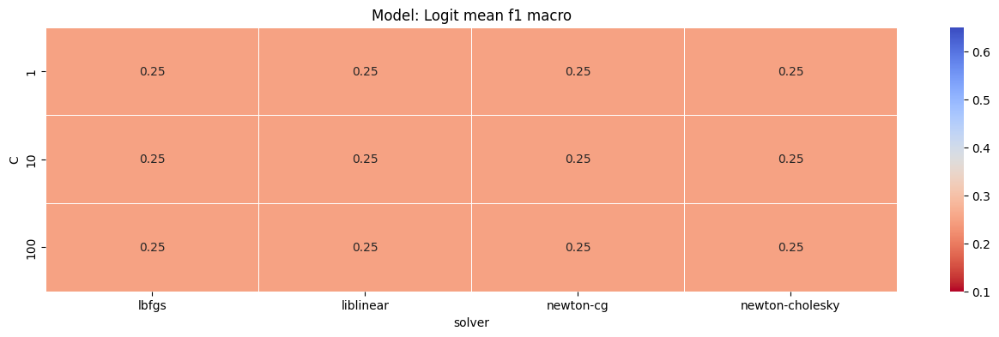

In [32]:
plot_tuning_results_lr(df_grid_logit)

In [33]:
# Store best Hyperparameters in a variable
best_param_grid_logit = grid_search_logit.best_params_

# Select best hyperparameters for optimized model training
best_params_logit = dict(C = best_param_grid_logit['C'], solver = best_param_grid_logit['solver']
                         )

print(f"Logit GridSearch Optimized Hyperparameters: {best_params_logit}")

Logit GridSearch Optimized Hyperparameters: {'C': 100, 'solver': 'newton-cg'}


#### Tune Logit model cv:

In [34]:
numb_split = 5
rand_state = 123

# Create logistic regression model multi_class One-Versus-Rest
tune_logit_cv = LogisticRegression(**best_params_logit, multi_class='ovr', random_state=rand_state)

# Define the StratifiedKFold for cross-validation
stratified_kfold = StratifiedKFold(n_splits=numb_split, shuffle=True, random_state=rand_state)

# Evaluate model with cross validation using F1 macro score
f1_scorer = make_scorer(f1_score, average='macro')

# Measure traininig time
start_time = time.time()
tune_logit_cv_results = cross_validate(tune_logit_cv, X_train_trans, y_train, cv=stratified_kfold, scoring=f1_scorer, return_train_score=True)
end_time = time.time()
tune_logit_train_time = end_time - start_time

In [ ]:
# Print the cross-validation training time and scores:
print(f"Tune logit training time: {tune_logit_train_time} seconds for K-fold: {numb_split}\n")

In [36]:
# Train performance
print(f"Tune Logit Cross-val Mean f1 macro train_score: {np.mean(tune_logit_cv_results['train_score'])}")
print(f"Tune Logit Cross-val Standard Deviation of f1 macro train_score: {np.std(tune_logit_cv_results['train_score'])}")

Tune Logit Cross-val Mean f1 macro train_score: 0.2532126674920826
Tune Logit Cross-val Standard Deviation of f1 macro train_score: 0.000397399642509954


In [37]:
# Validation performance
print(f"Tune Logit Cross-val Mean f1 macro val_score: {np.mean(tune_logit_cv_results['test_score'])}")
print(f"Tune Logit Cross-val Standard Deviation of f1 macro val_score: {np.std(tune_logit_cv_results['test_score'])}")

Tune Logit Cross-val Mean f1 macro val_score: 0.25324032914199723
Tune Logit Cross-val Standard Deviation of f1 macro val_score: 0.00034005998691097843


#### Tune Logit Test performance

In [19]:
best_params_logit = {'C': 100, 'solver': 'newton-cg'}

# Tune Logistic Regresion model: 
grid_opt_logit = LogisticRegression(**best_params_logit, multi_class='ovr', random_state=rand_state)   

# Fit model with entire training dataset
grid_opt_logit.fit(X_train_trans, y_train)

LogisticRegression(C=100, multi_class='ovr', random_state=123,
                   solver='newton-cg')

In [20]:
# Make predictions on the test dataset
grid_opt_logit_pred = grid_opt_logit.predict(X_test_trans)

grid_opt_logit_f1_score = f1_score(y_test, grid_opt_logit_pred, average=None)
print(f"Grid Hyperparameter tuning Logit model F1 score: {grid_opt_logit_f1_score}")

Grid Hyperparameter tuning Logit model F1 score: [0.         0.6916379  0.06900424]



Tune Model - Logit f1 macro score: 0.2535473794186183

Tune Model - Logit precision macro score: 0.336020936329574

Tune Model - Logit recall macro score: 0.33792003419259614

Tune Model - Logit balanced accuracy score: 0.33792003419259614

Tune Model - Logit accuracy score: 0.5335857611801658

Tune Model - Logit cohen kappa score: 0.012838344911200061

Classification Report:

              precision    recall  f1-score   support

           3       0.00      0.00      0.00     36280
           4       0.54      0.98      0.69    202822
           5       0.47      0.04      0.07    141997

    accuracy                           0.53    381099
   macro avg       0.34      0.34      0.25    381099
weighted avg       0.46      0.53      0.39    381099




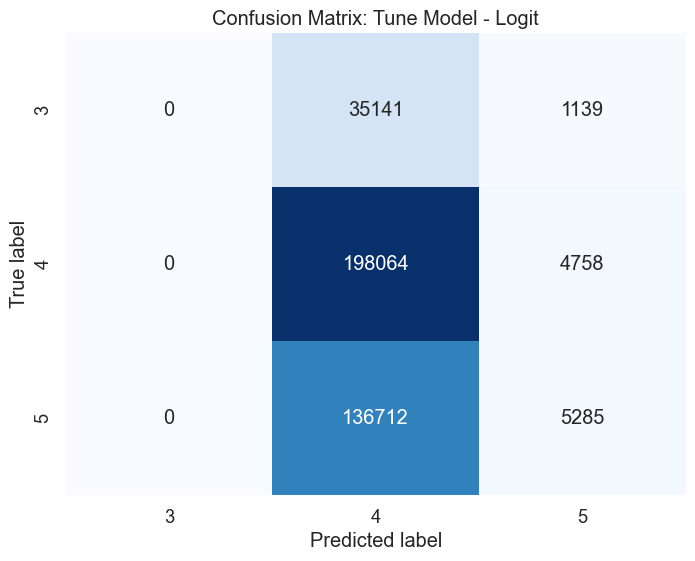

In [21]:
conf_matrix_classif_report('Tune Model - Logit', y_test, grid_opt_logit_pred)

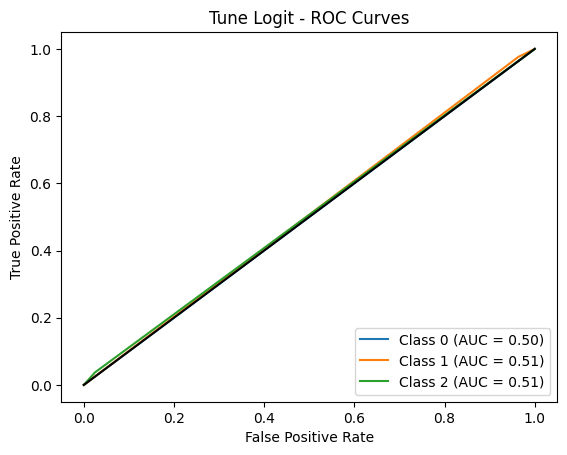

In [18]:
# Test performance
roc_curves("Tune Logit", y_train, y_test, grid_opt_logit_pred) 

## SHAP 

In [21]:
model_feature_names = ['holiday_type_local_holiday_in_the_city_of_madrid',
 'holiday_type_madrid_community_public_holiday',
 'holiday_type_national_holiday',
 'holiday_type_weekend',
 'holiday_type_workingday',
 'travel_time',
 'idunplug_latitude',
 'idunplug_longitude',
 'unplug_station_tot_bases',
 'idplug_latitude',
 'idplug_longitude',
 'plug_station_tot_bases',
 'tot_trips_day',
 'travel_revenue',
 'mh_distance_meters',
 '81',
 '82',
 '83',
 '86',
 '87',
 '88',
 '89',
 'month',
 'day',
 'hour',
 'time_group',
 'day_of_week']

In [22]:
X_test_trans[5]

array([ 0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
        0.34741523,  0.62838952,  0.38238132,  0.66666667,  0.81780077,
        0.37099912,  0.66666667,  0.10526316,  0.25      ,  0.16405174,
        0.84716981,  0.60055866,  0.29787234,  0.90789474,  0.21621622,
        0.20967742,  0.03571429,  1.        , 31.        , 13.        ,
        2.        ,  3.        ])

In [23]:
# Select stratified sample size
sub_X_train_bad, sub_X_test, sub_y_train_bad, sub_y_test = train_test_split(X_test_trans, y_test, test_size = 0.0008, stratify=y_test, random_state = rand_state)

In [24]:
# Summarize data using k-means due to computational limitations
summary_test_background = shap.kmeans(sub_X_test, 3)

# Create an explainer using SHAP Kernel with summarize sub_test data
kernel_explainer = shap.KernelExplainer(grid_opt_logit.predict,summary_test_background)

# Compute SHAP valuse for the test data:
shap_val_test_kernel = kernel_explainer.shap_values(sub_X_test)

100%|██████████| 305/305 [00:44<00:00,  6.89it/s]


In [25]:
# Display random selected samples:
y_shap_sub_test = pd.DataFrame(sub_y_test)
y_shap_sub_test.value_counts()

0
4    162
5    114
3     29
Name: count, dtype: int64

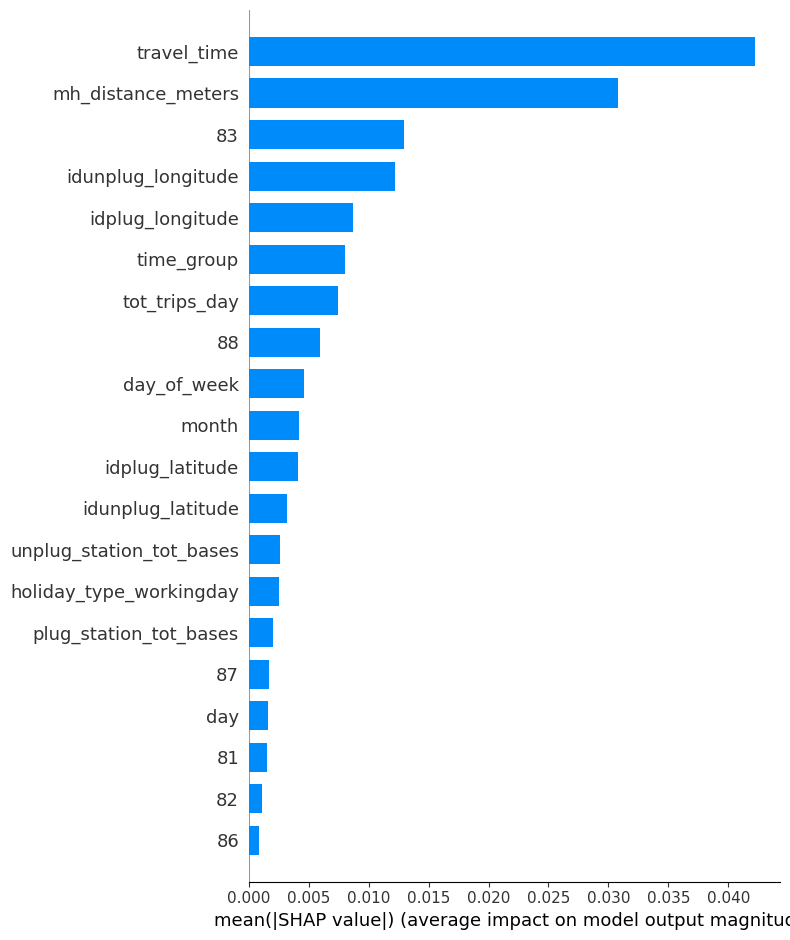

In [26]:
# Plot Shap Values Feature importance
shap.summary_plot(shap_val_test_kernel, feature_names=model_feature_names, plot_type='bar')

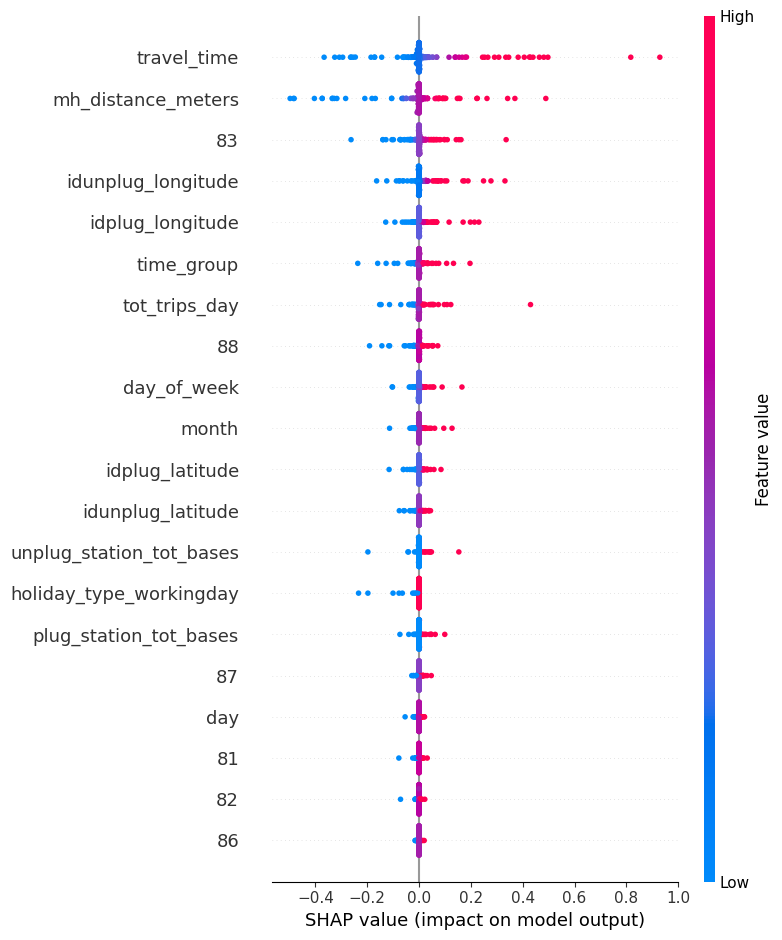

In [27]:
# Plot the aggregated SHAP values for the top ten features 
shap.summary_plot(shap_val_test_kernel,features=shap_val_test_kernel, feature_names=model_feature_names)

## Performance degradation:

In [29]:
feat_impo_test = pd.DataFrame(X_test_trans, columns=model_feature_names)
display(feat_impo_test.head())

,holiday_type_local_holiday_in_the_city_of_madrid,holiday_type_madrid_community_public_holiday,holiday_type_national_holiday,holiday_type_weekend,holiday_type_workingday,travel_time,idunplug_latitude,idunplug_longitude,unplug_station_tot_bases,idplug_latitude,idplug_longitude,plug_station_tot_bases,tot_trips_day,travel_revenue,mh_distance_meters,81,82,83,86,87,88,89,month,day,hour,time_group,day_of_week
0,0.0,0.0,0.0,0.0,1.0,0.148416,0.398492,0.754518,0.666667,0.512957,0.772087,0.666667,0.052632,0.25,0.106578,0.158491,0.000000,0.868794,0.210526,0.648649,0.685484,0.0,9.0,3.0,12.0,2.0,1.0
1,0.0,0.0,0.0,0.0,1.0,0.722068,0.244222,0.297815,0.500000,0.574514,0.057344,0.666667,0.052632,0.25,0.439799,0.316981,0.368715,0.680851,0.197368,0.405405,0.946237,0.0,6.0,13.0,20.0,4.0,3.0
2,0.0,0.0,0.0,0.0,1.0,0.561979,0.574514,0.057344,0.666667,0.408725,0.040578,0.833333,0.000000,0.25,0.148313,0.047170,0.620112,0.453901,0.776316,0.621622,0.333333,0.0,10.0,29.0,13.0,2.0,1.0
3,0.0,0.0,0.0,1.0,0.0,0.315731,0.225617,0.452899,0.666667,0.432411,0.436571,0.666667,0.052632,0.25,0.181746,0.230189,0.625698,0.960993,0.039474,0.540541,0.887097,0.0,8.0,3.0,18.0,3.0,5.0
4,0.0,0.0,0.0,0.0,1.0,0.617009,0.527184,0.366098,0.666667,0.006227,0.397397,0.833333,0.052632,0.25,0.450985,0.513208,0.620112,0.652482,0.078947,0.486486,0.991935,0.0,6.0,14.0,14.0,2.0,4.0


### Calculate SHAP Feature Importance 

In [30]:
# Calculate mean values from shap_values to extract most important feature list
vals_shap = np.abs(shap_val_test_kernel).mean(0)
vals_shap

# Store shap feature importance values in dataframe
feature_importance = pd.DataFrame(list(zip(model_feature_names, vals_shap)), columns=['col_name', 'feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'], ascending=False, inplace=True)

In [31]:
# List Feature importance order desc
rows_list_full = []
for index, row in feature_importance.iterrows():
    rows_list_full.append(row['col_name'])
rows_list_full

['travel_time',
 'mh_distance_meters',
 '83',
 'idunplug_longitude',
 'idplug_longitude',
 'time_group',
 'tot_trips_day',
 '88',
 'day_of_week',
 'month',
 'idplug_latitude',
 'idunplug_latitude',
 'unplug_station_tot_bases',
 'holiday_type_workingday',
 'plug_station_tot_bases',
 '87',
 'day',
 '81',
 '82',
 '86',
 'hour',
 '89',
 'holiday_type_weekend',
 'holiday_type_national_holiday',
 'travel_revenue',
 'holiday_type_local_holiday_in_the_city_of_madrid',
 'holiday_type_madrid_community_public_holiday']

In [32]:
# Model performance degradation:
# Create a copy of the test data to modify
test_asdf = feat_impo_test.copy(deep=True)

# Store original F1 score with unmodified data
original_pred = grid_opt_logit.predict(test_asdf)
original_f1 = f1_score(y_test, grid_opt_logit_pred, average='macro')

# Initialize a list to store F1 scores after each feature modification
f1_scores_logit = [original_f1]

In [33]:
f1_scores_logit = [original_f1]

In [34]:
perf_deg_grid_opt_logit = feat_impo_test.copy(deep=True)

# Review Feature Importance and select top 10 taking into account ohe, pairwise feat, numerical and categorical
top_feat_imp_grid_opt_logit = ['travel_time',
 'mh_distance_meters',
 '83',
 'idunplug_longitude',
 'time_group',
 'idplug_longitude',
 'tot_trips_day',
 '88',
 'day_of_week',
 'month']

# [1] Feature Importance marginalized
trav_time_mean = perf_deg_grid_opt_logit['travel_time'].mean()
perf_deg_grid_opt_logit['travel_time'] = trav_time_mean

# Store Feature [1] marginalized F1 score with unmodified data
trav_time_pred = grid_opt_logit.predict(perf_deg_grid_opt_logit)
trav_time_f1 = f1_score(y_test, trav_time_pred, average='macro')
f1_scores_logit.append(trav_time_f1)

# [1, 2] Feature Importance marginalized
mh_mean = perf_deg_grid_opt_logit['mh_distance_meters'].mean()
perf_deg_grid_opt_logit['mh_distance_meters'] = mh_mean

# Store Feature [1, 2] marginalized F1 score with unmodified data
mh_pred = grid_opt_logit.predict(perf_deg_grid_opt_logit)
mh_pred_f1 = f1_score(y_test, mh_pred, average='macro')
f1_scores_logit.append(mh_pred_f1)

# [1, 2, 3] Feature Importance marginalized
mean_83 = perf_deg_grid_opt_logit['83'].mean()
perf_deg_grid_opt_logit['83'] = mean_83

# Store Feature [1, 2, 3] marginalized F1 score with unmodified data
pred_83 = grid_opt_logit.predict(perf_deg_grid_opt_logit)
pred_83_f1 = f1_score(y_test, pred_83, average='macro')
f1_scores_logit.append(pred_83_f1)

# [1,2,3,4] Feature Importance marginalized
mode_value_lat = perf_deg_grid_opt_logit['idunplug_latitude'].mode()[0]  # Calculate mode
perf_deg_grid_opt_logit['idunplug_latitude'] = mode_value_lat

mode_value_lon = perf_deg_grid_opt_logit['idunplug_longitude'].mode()[0]  # Calculate mode
perf_deg_grid_opt_logit['idunplug_longitude'] = mode_value_lon

# Store Feature [1,2,3,4] marginalized F1 score with unmodified data
idunplug_pred = grid_opt_logit.predict(perf_deg_grid_opt_logit)
idunplug_pred_f1 = f1_score(y_test, idunplug_pred, average='macro')
f1_scores_logit.append(idunplug_pred_f1)

# Store Feature [1,2,3,4,5] marginalized F1 score with unmodified data
mode_value_time_group = perf_deg_grid_opt_logit['time_group'].mode()[0]  # Calculate mode
perf_deg_grid_opt_logit['time_group'] = mode_value_time_group

# Store Feature [1,2,3,4,5] marginalized F1 score with unmodified data
time_group_pred = grid_opt_logit.predict(perf_deg_grid_opt_logit)
time_group_pred_f1 = f1_score(y_test, time_group_pred, average='macro')
f1_scores_logit.append(time_group_pred_f1)

# [1,2,3,4,5,6] Feature Importance marginalized
mode_value_lat = perf_deg_grid_opt_logit['idplug_latitude'].mode()[0]  # Calculate mode
perf_deg_grid_opt_logit['idplug_latitude'] = mode_value_lat

mode_value_lon = perf_deg_grid_opt_logit['idplug_longitude'].mode()[0]  # Calculate mode
perf_deg_grid_opt_logit['idplug_longitude'] = mode_value_lon

# Store Feature [1,2,3,4,5,6] marginalized F1 score with unmodified data
idplug_pred = grid_opt_logit.predict(perf_deg_grid_opt_logit)
idplug_pred_f1 = f1_score(y_test, idplug_pred, average='macro')
f1_scores_logit.append(idplug_pred_f1)

# Store Feature [1,2,3,4,5,6,7] marginalized F1 score with unmodified data
mean_tot_trips_day = perf_deg_grid_opt_logit['tot_trips_day'].mean()
perf_deg_grid_opt_logit['tot_trips_day'] = mean_tot_trips_day

# Store Feature [1,2,3,4,5,6,7] marginalized F1 score with unmodified data
pred_tot_trips_day = grid_opt_logit.predict(perf_deg_grid_opt_logit)
pred_tot_trips_day_f1 = f1_score(y_test, pred_tot_trips_day, average='macro')
f1_scores_logit.append(pred_tot_trips_day_f1)

# Store Feature [1,2,3,4,5,6,7,8] marginalized F1 score with unmodified data
mean_88 = perf_deg_grid_opt_logit['88'].mean()
perf_deg_grid_opt_logit['88'] = mean_88

# Store Feature [1,2,3,4,5,6,7,8] marginalized F1 score with unmodified data
pred_88 = grid_opt_logit.predict(perf_deg_grid_opt_logit)
pred_88_f1 = f1_score(y_test, pred_88, average='macro')
f1_scores_logit.append(pred_88_f1)

# Store Feature [1,2,3,4,5,6,7,8,9] marginalized F1 score with unmodified data
mode_value_day_of_week = perf_deg_grid_opt_logit['day_of_week'].mode()[0]  # Calculate mode
perf_deg_grid_opt_logit['day_of_week'] = mode_value_day_of_week

# Store Feature [1,2,3,4,5,6,7,8,9] marginalized F1 score with unmodified data
day_of_week_pred = grid_opt_logit.predict(perf_deg_grid_opt_logit)
day_of_week_pred_f1 = f1_score(y_test, day_of_week_pred, average='macro')
f1_scores_logit.append(day_of_week_pred_f1)

# [1,2,3,4,5,6,7,8,9,10] Feature Importance marginalized
mode_value_month = perf_deg_grid_opt_logit['month'].mode()[0]  # Calculate mode
perf_deg_grid_opt_logit['month'] = mode_value_month

# Store Feature [1,2,3,4,5,6,7,8,9,10] marginalized F1 score with unmodified data
month_pred = grid_opt_logit.predict(perf_deg_grid_opt_logit)
month_pred_f1 = f1_score(y_test, month_pred, average='macro')
f1_scores_logit.append(month_pred_f1)

In [35]:
f1_scores_logit

[0.2535473794186183,
 0.25672725957877923,
 0.23570651667379286,
 0.2361648792693994,
 0.23190167497796563,
 0.23181192222748515,
 0.23157691427280117,
 0.2315632879561904,
 0.2315632879561904,
 0.2315632879561904,
 0.2315632879561904]

In [36]:
perf_deg_grid_opt_logit.head()

,holiday_type_local_holiday_in_the_city_of_madrid,holiday_type_madrid_community_public_holiday,holiday_type_national_holiday,holiday_type_weekend,holiday_type_workingday,travel_time,idunplug_latitude,idunplug_longitude,unplug_station_tot_bases,idplug_latitude,idplug_longitude,plug_station_tot_bases,tot_trips_day,travel_revenue,mh_distance_meters,81,82,83,86,87,88,89,month,day,hour,time_group,day_of_week
0,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.666667,0.06181,0.25,0.269556,0.158491,0.000000,0.510465,0.210526,0.648649,0.560063,0.0,6.0,3.0,12.0,2.0,1.0
1,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.500000,0.574196,0.333952,0.666667,0.06181,0.25,0.269556,0.316981,0.368715,0.510465,0.197368,0.405405,0.560063,0.0,6.0,13.0,20.0,2.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.833333,0.06181,0.25,0.269556,0.047170,0.620112,0.510465,0.776316,0.621622,0.560063,0.0,6.0,29.0,13.0,2.0,1.0
3,0.0,0.0,0.0,1.0,0.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.666667,0.06181,0.25,0.269556,0.230189,0.625698,0.510465,0.039474,0.540541,0.560063,0.0,6.0,3.0,18.0,2.0,1.0
4,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.833333,0.06181,0.25,0.269556,0.513208,0.620112,0.510465,0.078947,0.486486,0.560063,0.0,6.0,14.0,14.0,2.0,1.0


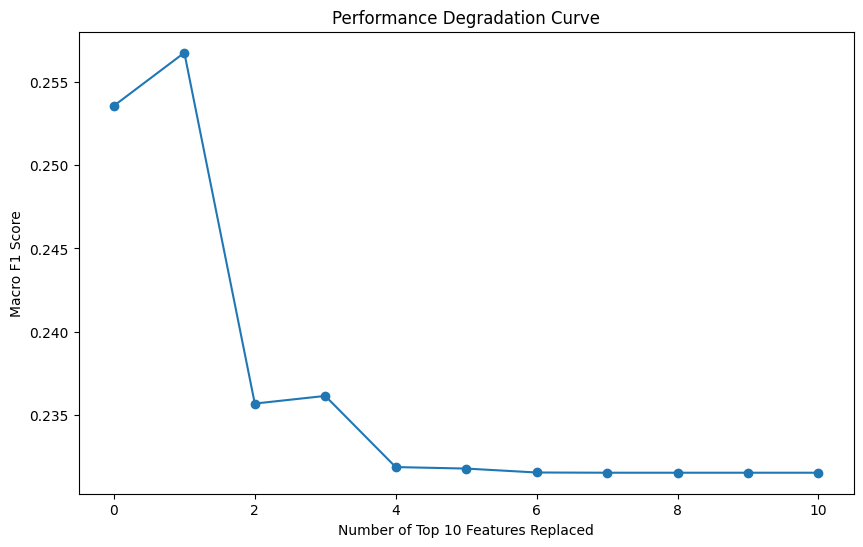

In [37]:
# Plot the performance degradation curve
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_logit)), f1_scores_logit, marker='o')
plt.title('Performance Degradation Curve')
plt.xlabel('Number of Top 10 Features Replaced')
plt.ylabel('Macro F1 Score')
plt.grid(False)


Performance Degradation After Top 6 - Logit f1 macro score: 0.2315632879561904

Performance Degradation After Top 6 - Logit precision macro score: 0.1774009728005934

Performance Degradation After Top 6 - Logit recall macro score: 0.3333333333333333

Performance Degradation After Top 6 - Logit balanced accuracy score: 0.3333333333333333

Performance Degradation After Top 6 - Logit accuracy score: 0.5322029184017801

Performance Degradation After Top 6 - Logit cohen kappa score: 0.0

Classification Report:

              precision    recall  f1-score   support

           3       0.00      0.00      0.00     36280
           4       0.53      1.00      0.69    202822
           5       0.00      0.00      0.00    141997

    accuracy                           0.53    381099
   macro avg       0.18      0.33      0.23    381099
weighted avg       0.28      0.53      0.37    381099




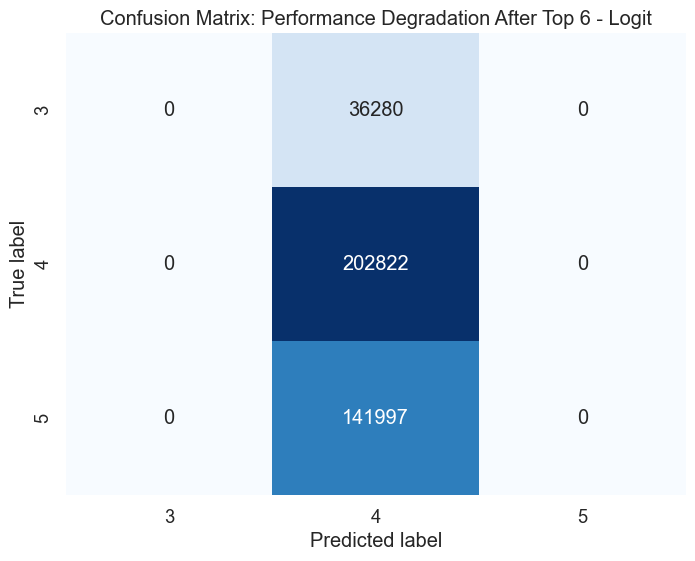

In [40]:
# After removing Top 6 Features Logit behaves like a Dummy Classifier
conf_matrix_classif_report('Performance Degradation After Top 6 - Logit', y_test, pred_88)

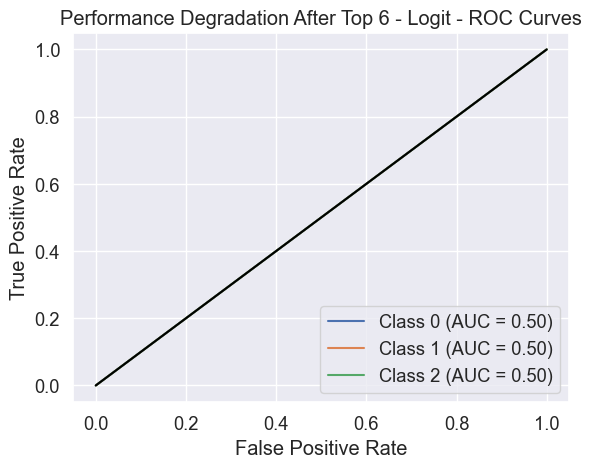

In [42]:
# After removing Top 6 Features Logit behaves like a Dummy Classifier
roc_curves("Performance Degradation After Top 6 - Logit", y_train, y_test, pred_88) 

### LIME
   Code inspired from following example: https://nbviewer.org/github/naiborhujosua/Blog_Notes/blob/main/notebook/interpreting-black-box-models.ipynb

In [55]:
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=sub_X_train,
    training_labels=sub_y_train,
    feature_names=model_feature_names,
    class_names=['3', '4','5'],
    mode='classification'
)

In [56]:
sub_X_test_df = pd.DataFrame(sub_X_test,columns=model_feature_names)

In [57]:
exp_lime = explainer_lime.explain_instance(
    data_row=sub_X_test_df.iloc[1], 
    predict_fn=grid_opt_logit.predict_proba, 
    num_features=10
)

exp_lime.show_in_notebook(show_table=True)
exp_lime.save_to_file('tune_logit_lime_local.html')

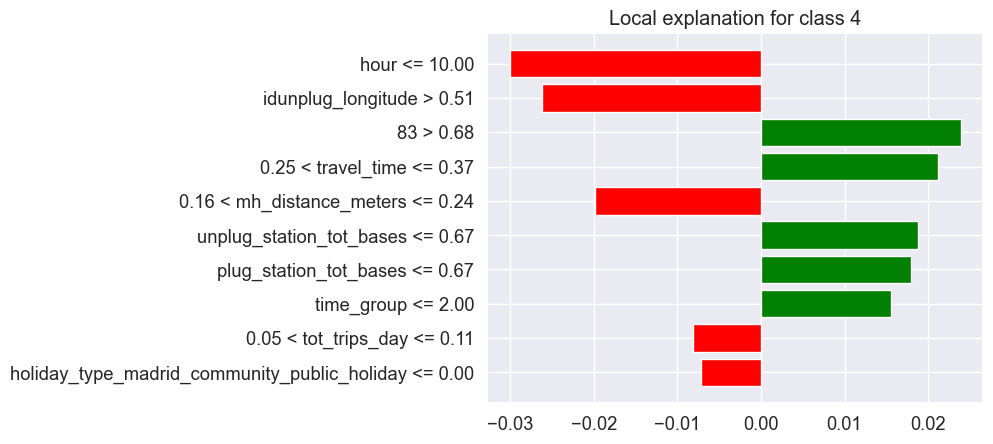

In [58]:
figure = exp_lime.as_pyplot_figure(label = exp_lime.available_labels()[0])

In [59]:
# Using SP-LIME to return explanations on a sample data set 
# to obtain a non-redundant global decision perspective of the base model
sp_exp_lime = submodular_pick.SubmodularPick(explainer_lime, 
                                        sub_X_test,
                                        predict_fn=grid_opt_logit.predict_proba,
                                        num_features=5,
                                        num_exps_desired=5)

In [60]:
# Global Interpretability on subset instances
for i, exp in enumerate(sp_exp_lime.sp_explanations):
    # Plot results
    exp_lime.show_in_notebook()

    # Save the results as html
    file_name = f'tune_logit_global_lime_explanation_{i}.html'
    exp.save_to_file(file_name)
    print(f"Explanation saved to {file_name}")

print('SP-LIME Explanations for Base Logit.')


Explanation saved to tune_logit_global_lime_explanation_0.html


Explanation saved to tune_logit_global_lime_explanation_1.html


Explanation saved to tune_logit_global_lime_explanation_2.html


Explanation saved to tune_logit_global_lime_explanation_3.html


Explanation saved to tune_logit_global_lime_explanation_4.html
SP-LIME Explanations for Base Logit.


SP-LIME Local Explanations


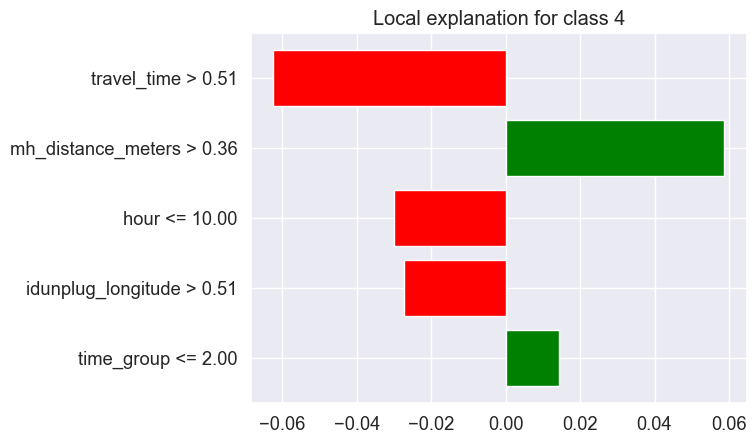

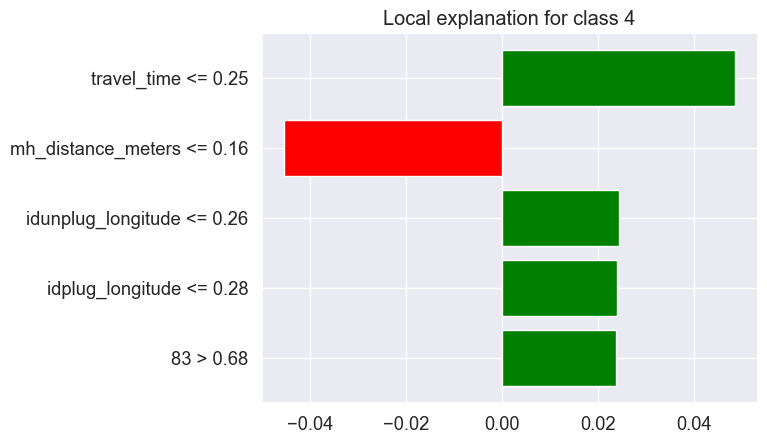

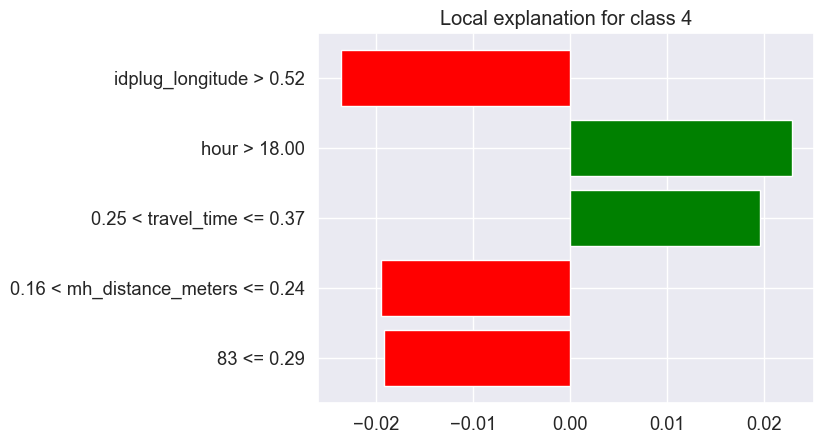

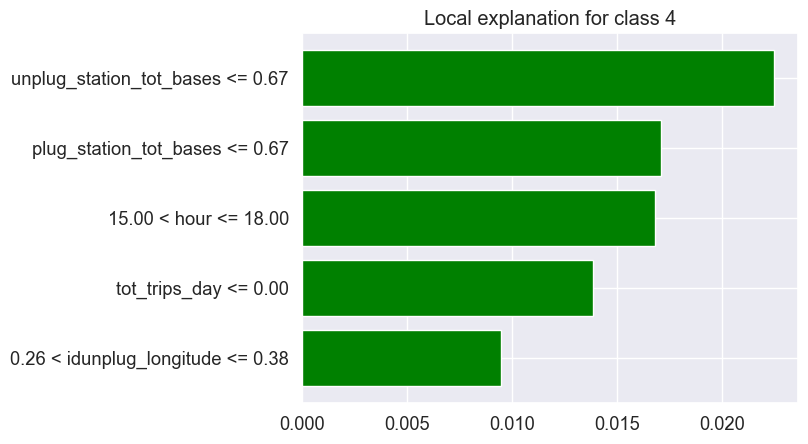

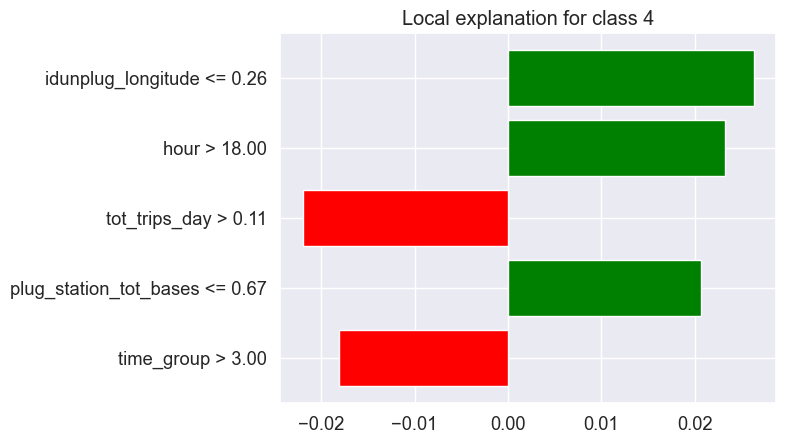

In [61]:
# Global Interpretability on subset instances
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_exp_lime.sp_explanations]
print('SP-LIME Local Explanations')

## RandomSearch optimized Logit


In [31]:
##
## Code inspared from https://datagy.io/python-optuna/
##

numb_split = 5
rand_state = 123


# Create StratifiedKFold object for stratified cross-validation
skf = StratifiedKFold(n_splits=numb_split, shuffle=True, random_state=rand_state)

def objective_logit(trial):
    solver = trial.suggest_categorical("solver", ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky'])
    C = trial.suggest_int("C", 1, 100, step=2)
    
    logit_params = dict(solver = solver, C = C)

    clf_logit_opt = LogisticRegression(**logit_params, multi_class='ovr', random_state=rand_state)    
    score_logit = cross_val_score(clf_logit_opt, X_train_lr, y_train, cv=skf, scoring='f1_macro') # Update X and y
    f1_macro_logit = score_logit.mean()    
    return float(f1_macro_logit)

In [32]:
study_logit = optuna.create_study(directions=['maximize'])
study_logit.optimize(objective_logit, n_trials=30)

[I 2024-04-12 18:43:56,947] A new study created in memory with name: no-name-a6cf9081-1961-4ada-b792-53caadb368ec
[I 2024-04-12 18:50:32,017] Trial 0 finished with value: 0.2503783016934281 and parameters: {'solver': 'liblinear', 'C': 33}. Best is trial 0 with value: 0.2503783016934281.
[I 2024-04-12 18:57:46,210] Trial 1 finished with value: 0.25038506512892245 and parameters: {'solver': 'newton-cg', 'C': 55}. Best is trial 1 with value: 0.25038506512892245.
[I 2024-04-12 19:00:13,681] Trial 2 finished with value: 0.25036257134275525 and parameters: {'solver': 'lbfgs', 'C': 17}. Best is trial 1 with value: 0.25038506512892245.
[I 2024-04-12 19:07:24,563] Trial 3 finished with value: 0.25038506512892245 and parameters: {'solver': 'newton-cg', 'C': 91}. Best is trial 1 with value: 0.25038506512892245.
[I 2024-04-12 19:14:27,561] Trial 4 finished with value: 0.25038506512892245 and parameters: {'solver': 'newton-cg', 'C': 51}. Best is trial 1 with value: 0.25038506512892245.
[I 2024-04-1

<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

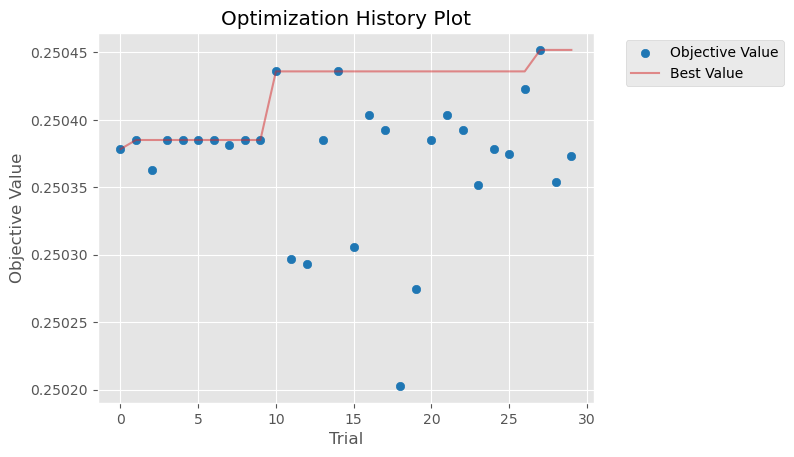

In [33]:
optuna.visualization.matplotlib.plot_optimization_history(study_logit)

In [34]:
logit_params = study_logit.best_params
print(logit_params)

{'solver': 'lbfgs', 'C': 67}


In [35]:
best_params_logit = dict(solver=logit_params['solver'], C = logit_params['C']
                         )

print(f"Logistic Regression Optimized Hyperparameters: {best_params_logit}")

Logistic Regression Optimized Hyperparameters: {'solver': 'lbfgs', 'C': 67}


In [36]:
#Optuna optimized Logistic Regresion model: 
opt_mod_logit = LogisticRegression(**best_params_logit, multi_class='ovr', random_state=rand_state)   

# Fit model with entire training dataset
opt_mod_logit.fit(X_train_lr,y_train)

LogisticRegression(C=67, multi_class='ovr', random_state=123)

In [37]:
# Make predictions on the test dataset
opt_mod_logit_pred = opt_mod_logit.predict(X_test_lr)

opt_mod_logit_f1_score = f1_score(y_test, opt_mod_logit_pred, average=None)
print(f"Logit model F1 score: {opt_mod_logit_f1_score}")

Logit model F1 score: [0.         0.68929287 0.06074749]


In [38]:
print(classification_report(y_test, opt_mod_logit_pred))
print(confusion_matrix(y_test, opt_mod_logit_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00     38462
           4       0.53      0.98      0.69    210656
           5       0.45      0.03      0.06    149171

    accuracy                           0.53    398289
   macro avg       0.33      0.34      0.25    398289
weighted avg       0.45      0.53      0.39    398289

[[     0  37109   1353]
 [     0 206193   4463]
 [     0 144316   4855]]


## Logit SMOTE
!Note WIP 

In [ ]:
# Example from stackoverflow: https://stackoverflow.com/questions/50245684/using-smote-with-gridsearchcv-in-scikit-learn
# How to call parameters in Pipeline: https://stackoverflow.com/questions/58815016/cross-validating-with-imblearn-pipeline-and-gridsearchcv

from imblearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold

numb_split = 5
rand_state = 123

# Define the scoring metric as F1 score macro
scoring = make_scorer(f1_score, average='macro')

# Start measuring time
start_time = time.time()

# Create Logistic Regression classifier
logit = LogisticRegression(multi_class='ovr', random_state=rand_state)

# Create StratifiedKFold object for stratified cross-validation
skf = StratifiedKFold(n_splits=numb_split, shuffle=True, random_state=rand_state)

# Create a pipeline with SMOTE and Logistic Regression
pipeline_grid_logit_smote = Pipeline([
    ('smote', SMOTE(random_state=rand_state)),
    ('logit', logit)
])

# Define the hyperparameters and their possible values
param_grid_logit = {'logit__solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky'],
              'logit__C': [1, 10, 100]}

# Create a grid search object
grid_search_logit_smote = GridSearchCV(estimator=pipeline_grid_logit_smote, param_grid=param_grid_logit, scoring=scoring, cv=skf)

# Fit the grid search to your data
grid_search_logit_smote.fit(X_train_trans, y_train)

# Calculate elapsed time
end_time = time.time()
elapsed_time = end_time - start_time

# Print the best hyperparameters
print(f"Elapsed time: {elapsed_time} seconds")
print("Best Hyperparameters:", grid_search_logit_smote.best_params_)
print("Best Hyperparameter Tune Logit model with SMOTE mean f1 macro score:", grid_search_logit_smote.best_score_)

In [19]:
df_grid_logit_smote = pd.DataFrame(grid_search_logit_smote.cv_results_["params"]).sort_values(by=['logit__C', 'logit__solver'])
df_grid_logit_smote 

,logit__C,logit__solver
0,1,lbfgs
1,1,liblinear
2,1,newton-cg
3,1,newton-cholesky
4,10,lbfgs
5,10,liblinear
6,10,newton-cg
7,10,newton-cholesky
8,100,lbfgs
9,100,liblinear


In [20]:
df_grid_logit_smote['mean_f1_macro'] = np.round(grid_search_logit_smote.cv_results_["mean_test_score"],3)
df_grid_logit_smote['std_f1_macro'] = np.round(grid_search_logit_smote.cv_results_["std_test_score"],4)
df_grid_logit_smote 


,logit__C,logit__solver,mean_f1_macro,std_f1_macro
0,1,lbfgs,0.319,0.0022
1,1,liblinear,0.323,0.0003
2,1,newton-cg,0.323,0.0003
3,1,newton-cholesky,0.323,0.0003
4,10,lbfgs,0.320,0.0013
5,10,liblinear,0.323,0.0003
6,10,newton-cg,0.323,0.0003
7,10,newton-cholesky,0.323,0.0003
8,100,lbfgs,0.318,0.0023
9,100,liblinear,0.323,0.0004


In [21]:
def plot_tuning_results_logit(df_val):

    pivot1 = df_val.pivot_table(index='logit__C',columns='logit__solver',values='mean_f1_macro')
    
    plt.subplots(1, 1, figsize=(16,4))

    sns.heatmap(pivot1,vmin=0.10,vmax=0.65,annot=True,linewidths=0.4,cmap="coolwarm_r") # changed from vmin=0.45
    plt.title("Tuned Model - Logit with SMOTE: mean f1 macro")

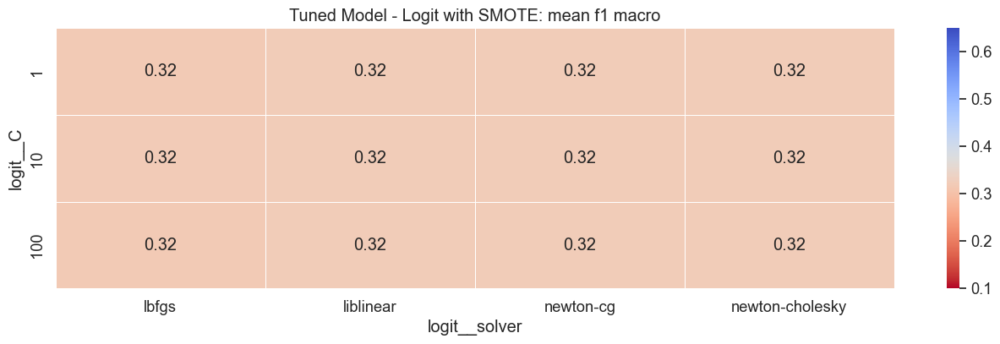

In [53]:
plot_tuning_results_logit(df_grid_logit_smote)

In [22]:
# Store best Hyperparameters in a variable
best_param_grid_logit_smote = grid_search_logit_smote.best_params_

# Select best hyperparameters for optimized model training
best_params_logit_smote = dict(C = best_param_grid_logit_smote['logit__C'], solver = best_param_grid_logit_smote['logit__solver']
                         )

print(f"Logit with SMOTE GridSearch Optimized Hyperparameters: {best_params_logit_smote}")

Logit with SMOTE GridSearch Optimized Hyperparameters: {'C': 1, 'solver': 'newton-cg'}


### Tune Logit with SMOTE CV
TBF Add SMOTE steps

In [23]:
numb_split = 5
rand_state = 123

# Create logistic regression model multi_class One-Versus-Rest
tune_logit_cv = LogisticRegression(**best_params_logit_smote, multi_class='ovr', random_state=rand_state)

# Define the StratifiedKFold for cross-validation
stratified_kfold = StratifiedKFold(n_splits=numb_split, shuffle=True, random_state=rand_state)

# Evaluate model with cross validation using F1 macro score
f1_scorer = make_scorer(f1_score, average='macro')

# Set up pipeline with SMOTE to prevent data leakage 
pipeline_logit_smote = Pipeline([
    ('smote', SMOTE(random_state=rand_state)),
    ('opt_tune_logit', tune_logit_cv)
])

# Measure traininig time
start_time = time.time()
tune_logit_smote_cv_results = cross_validate(pipeline_logit_smote, X_train_trans, y_train, cv=stratified_kfold, scoring=f1_scorer, return_train_score=True)
end_time = time.time()
tune_logit_train_time = end_time - start_time

In [ ]:
# Print the cross-validation training time and scores:
print(f"Tune logit with SMOTE training time: {tune_logit_train_time} seconds for K-fold: {numb_split}\n")

In [25]:
# Train performance
print(f"Tune Logit with SMOTE Cross-val Mean f1 macro train_score: {np.mean(tune_logit_smote_cv_results['train_score'])}")
print(f"Tune Logit with SMOTE Cross-val Standard Deviation of f1 macro train_score: {np.std(tune_logit_smote_cv_results['train_score'])}")

Tune Logit with SMOTE Cross-val Mean f1 macro train_score: 0.3229343940167093
Tune Logit with SMOTE Cross-val Standard Deviation of f1 macro train_score: 0.0003672326581170514


In [26]:
# Validation performance
print(f"Tune Logit with SMOTE Cross-val Mean f1 macro val_score: {np.mean(tune_logit_smote_cv_results['test_score'])}")
print(f"Tune Logit with SMOTE Cross-val Standard Deviation of f1 macro val_score: {np.std(tune_logit_smote_cv_results['test_score'])}")

Tune Logit with SMOTE Cross-val Mean f1 macro val_score: 0.3229073378526853
Tune Logit with SMOTE Cross-val Standard Deviation of f1 macro val_score: 0.00033820881140596574


### Tune Logit with SMOTE Test performance

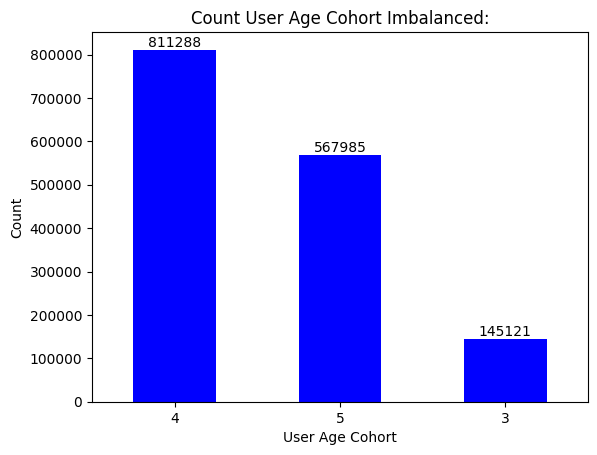

In [27]:
""" User ageRange values active population: {3:[19:26]; 4:[27:40]; 5:[41:65]}"""

# Support dataframe to plot imbalanced age cohort value counts
y_train_df = pd.DataFrame(y_train)

# User Age Cohort value counts
user_age_count = y_train_df[0].value_counts()

# Create barplot
ax = user_age_count.plot(kind='bar', rot=0, color=['blue'])

# Add values on top of each bar
for i, v in enumerate(user_age_count):
    ax.text(i, v + 1, v, ha='center', va='bottom', color='black')

plt.xlabel('User Age Cohort')
plt.ylabel('Count')
plt.title('Count User Age Cohort Imbalanced:')

# Show the plot
plt.show()

In [43]:
# Apply SMOTE to the training data
smote = SMOTE(random_state=123)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_trans, y_train)

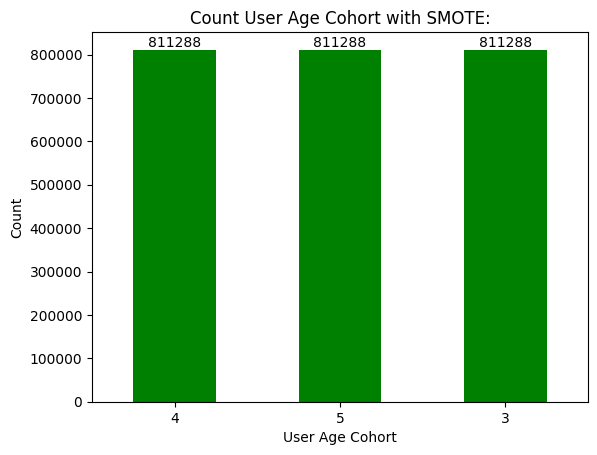

In [29]:
""" User ageRange values active population: {3:[19:26]; 4:[27:40]; 5:[41:65]}"""

# Support dataframe to plot age cohort value counts with SMOTE
y_train_resampled_df = pd.DataFrame(y_train_resampled)

# User Age Cohort value counts
user_age_count_resampled = y_train_resampled_df[0].value_counts()

# Create barplot
ax = user_age_count_resampled.plot(kind='bar', rot=0, color=['green'])

# Add values on top of each bar
for i, v in enumerate(user_age_count_resampled):
    ax.text(i, v + 1, v, ha='center', va='bottom', color='black')

plt.xlabel('User Age Cohort')
plt.ylabel('Count')
plt.title('Count User Age Cohort with SMOTE:')

# Show the plot
plt.show()

In [44]:
best_params_logit_smote = {'C': 1, 'solver': 'newton-cg'}

# GridSearch Tune Logit model with SMOTE : 
tune_logit_smote = LogisticRegression(**best_params_logit_smote, multi_class='ovr', random_state=rand_state)

In [45]:
# Fit model with entire training dataset including SMOTE
tune_logit_smote.fit(X_train_resampled, y_train_resampled)

LogisticRegression(C=1, multi_class='ovr', random_state=123, solver='newton-cg')

In [40]:
# Make predictions on the test dataset
tune_logit_smote_pred = tune_logit_smote.predict(X_test_trans)

tune_logit_smote_f1_score = f1_score(y_test, tune_logit_smote_pred, average=None)
print(f"Tune Logit with SMOTE age group F1 score: {tune_logit_smote_f1_score}")

Tune Logit with SMOTE age group F1 score: [0.19069912 0.34629618 0.43278146]



Tune Model - Logit with SMOTE: f1 macro score: 0.32325892116583527

Tune Model - Logit with SMOTE: precision macro score: 0.36512551222820283

Tune Model - Logit with SMOTE: recall macro score: 0.3853741106918518

Tune Model - Logit with SMOTE: balanced accuracy score: 0.3853741106918518

Tune Model - Logit with SMOTE: accuracy score: 0.34413630054132915

Tune Model - Logit with SMOTE: cohen kappa score: 0.04829755903641486

Classification Report:

              precision    recall  f1-score   support

           3       0.12      0.46      0.19     36280
           4       0.56      0.25      0.35    202822
           5       0.42      0.45      0.43    141997

    accuracy                           0.34    381099
   macro avg       0.37      0.39      0.32    381099
weighted avg       0.46      0.34      0.36    381099




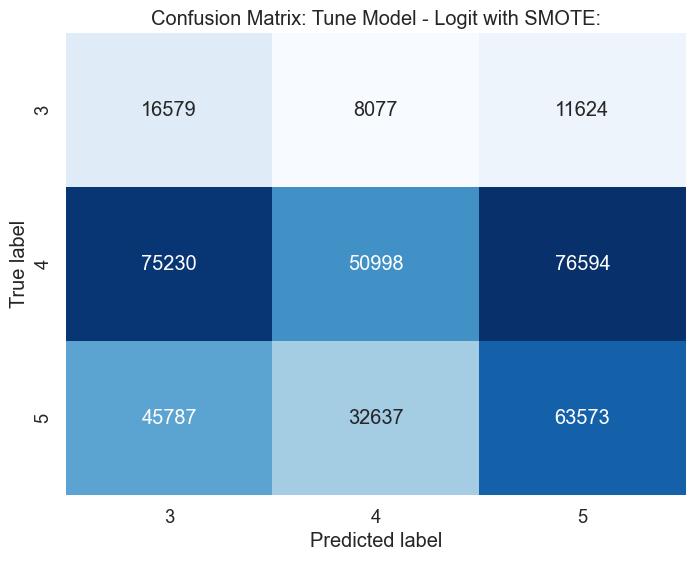

In [26]:
conf_matrix_classif_report('Tune Model - Logit with SMOTE:', y_test, tune_logit_smote_pred)

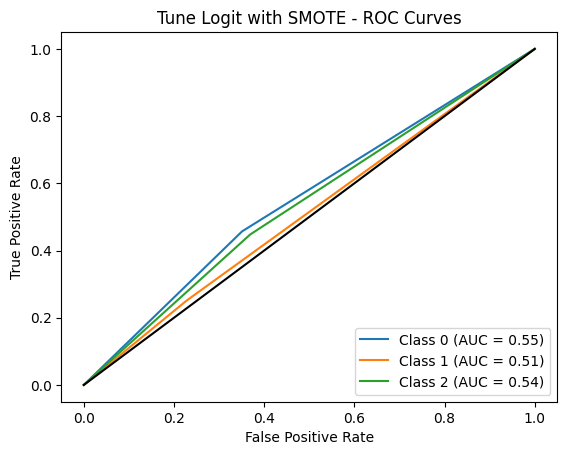

In [23]:
# Test performance
roc_curves("Tune Logit with SMOTE", y_train_resampled, y_test, tune_logit_smote_pred) 

### SHAP with SMOTE

In [46]:
# Select stratified sample size
sub_X_train_bad, sub_X_test, sub_y_train_bad, sub_y_test = train_test_split(X_test_trans, y_test, test_size = 0.0008, stratify=y_test, random_state = rand_state)

In [47]:
# Summarize data using k-means due to computational limitations
summary_test_background = shap.kmeans(sub_X_test, 3)

# Create an explainer using SHAP Kernel with summarize sub_test data
kernel_explainer = shap.KernelExplainer(tune_logit_smote.predict,summary_test_background)

# Compute SHAP valuse for the test data:
shap_val_test_kernel = kernel_explainer.shap_values(sub_X_test)

100%|██████████| 305/305 [00:56<00:00,  5.42it/s]


In [48]:
# Display random selected samples:
y_shap_sub_test = pd.DataFrame(sub_y_test)
y_shap_sub_test.value_counts() 

0
4    162
5    114
3     29
Name: count, dtype: int64

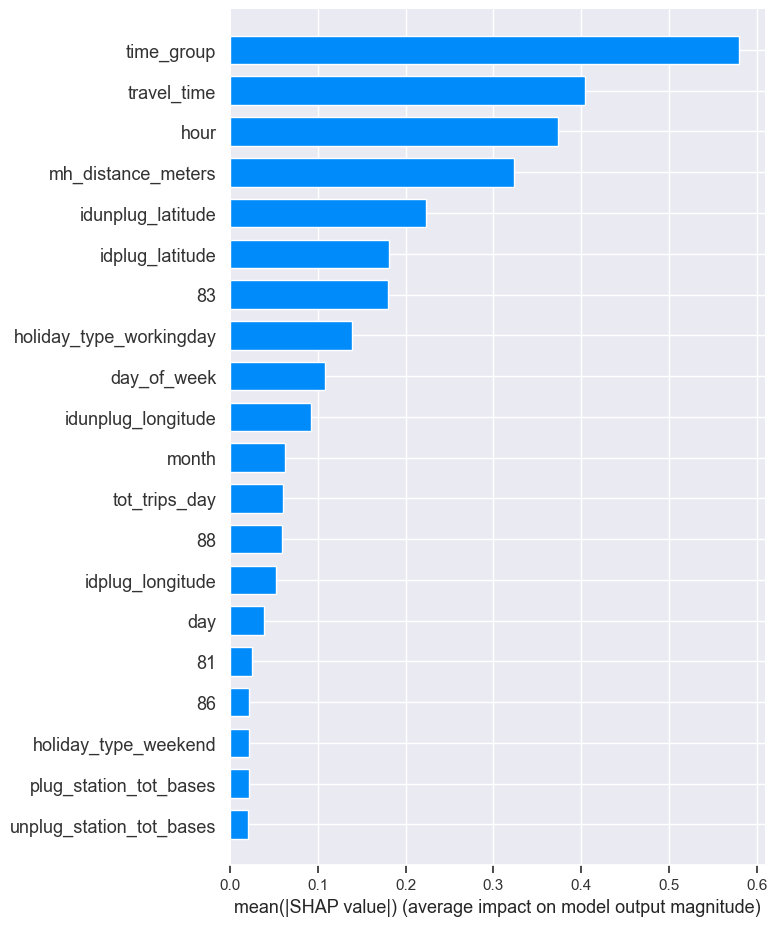

In [49]:
# Plot Shap Values Feature importance
shap.summary_plot(shap_val_test_kernel, feature_names=model_feature_names, plot_type='bar')

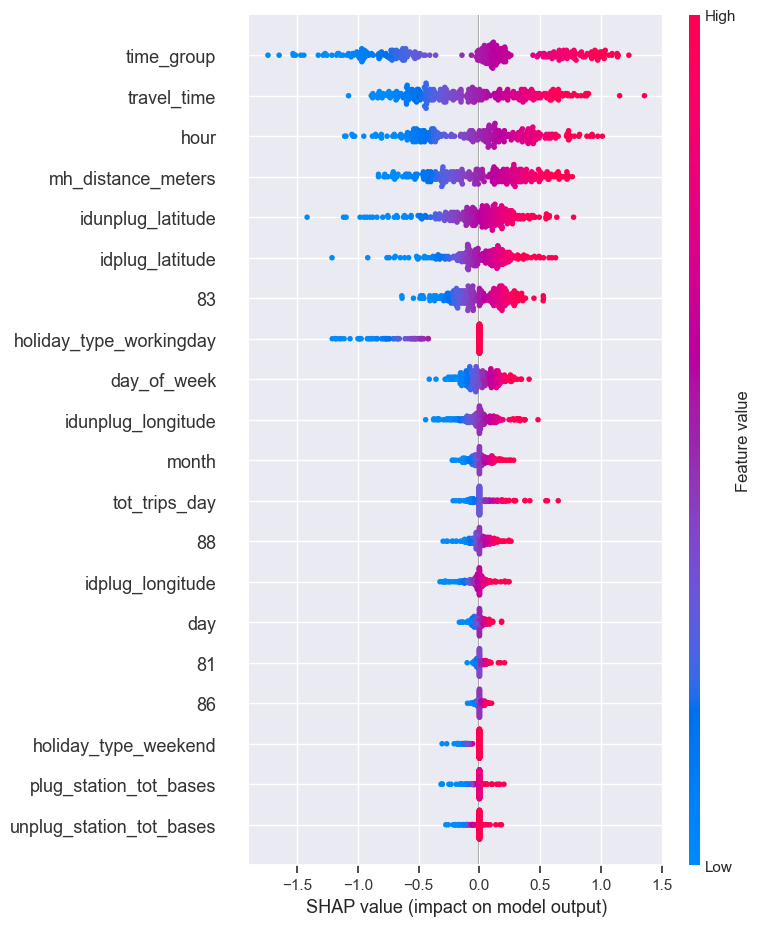

In [50]:
# Plot the aggregated SHAP values for the top ten features 
shap.summary_plot(shap_val_test_kernel,features=shap_val_test_kernel, feature_names=model_feature_names)

## Performance degradation:

In [51]:
feat_impo_test = pd.DataFrame(X_test_trans, columns=model_feature_names)
display(feat_impo_test.head())

,holiday_type_local_holiday_in_the_city_of_madrid,holiday_type_madrid_community_public_holiday,holiday_type_national_holiday,holiday_type_weekend,holiday_type_workingday,travel_time,idunplug_latitude,idunplug_longitude,unplug_station_tot_bases,idplug_latitude,idplug_longitude,plug_station_tot_bases,tot_trips_day,travel_revenue,mh_distance_meters,81,82,83,86,87,88,89,month,day,hour,time_group,day_of_week
0,0.0,0.0,0.0,0.0,1.0,0.148416,0.398492,0.754518,0.666667,0.512957,0.772087,0.666667,0.052632,0.25,0.106578,0.158491,0.000000,0.868794,0.210526,0.648649,0.685484,0.0,9.0,3.0,12.0,2.0,1.0
1,0.0,0.0,0.0,0.0,1.0,0.722068,0.244222,0.297815,0.500000,0.574514,0.057344,0.666667,0.052632,0.25,0.439799,0.316981,0.368715,0.680851,0.197368,0.405405,0.946237,0.0,6.0,13.0,20.0,4.0,3.0
2,0.0,0.0,0.0,0.0,1.0,0.561979,0.574514,0.057344,0.666667,0.408725,0.040578,0.833333,0.000000,0.25,0.148313,0.047170,0.620112,0.453901,0.776316,0.621622,0.333333,0.0,10.0,29.0,13.0,2.0,1.0
3,0.0,0.0,0.0,1.0,0.0,0.315731,0.225617,0.452899,0.666667,0.432411,0.436571,0.666667,0.052632,0.25,0.181746,0.230189,0.625698,0.960993,0.039474,0.540541,0.887097,0.0,8.0,3.0,18.0,3.0,5.0
4,0.0,0.0,0.0,0.0,1.0,0.617009,0.527184,0.366098,0.666667,0.006227,0.397397,0.833333,0.052632,0.25,0.450985,0.513208,0.620112,0.652482,0.078947,0.486486,0.991935,0.0,6.0,14.0,14.0,2.0,4.0


### Calculate SHAP Feature Importance 

In [52]:
# Calculate mean values from shap_values to extract most important feature list
vals_shap = np.abs(shap_val_test_kernel).mean(0)
vals_shap

# Store shap feature importance values in dataframe
feature_importance = pd.DataFrame(list(zip(model_feature_names, vals_shap)), columns=['col_name', 'feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'], ascending=False, inplace=True)

In [53]:
# List Feature importance order desc
rows_list_full = []
for index, row in feature_importance.iterrows():
    rows_list_full.append(row['col_name'])
rows_list_full

['time_group',
 'travel_time',
 'hour',
 'mh_distance_meters',
 'idunplug_latitude',
 'idplug_latitude',
 '83',
 'holiday_type_workingday',
 'day_of_week',
 'idunplug_longitude',
 'month',
 'tot_trips_day',
 '88',
 'idplug_longitude',
 'day',
 '81',
 '86',
 'holiday_type_weekend',
 'plug_station_tot_bases',
 'unplug_station_tot_bases',
 '87',
 '89',
 '82',
 'holiday_type_national_holiday',
 'holiday_type_local_holiday_in_the_city_of_madrid',
 'travel_revenue',
 'holiday_type_madrid_community_public_holiday']

In [55]:
# Model performance degradation:
# Create a copy of the test data to modify
test_asdf = feat_impo_test.copy(deep=True)

# Store original F1 score with unmodified data
original_pred = tune_logit_smote.predict(test_asdf)
original_f1 = f1_score(y_test, original_pred, average='macro')

# Initialize a list to store F1 scores after each feature modification
f1_scores_logit_smote = [original_f1]

In [ ]:
f1_scores_logit_smote = [original_f1]

In [56]:
perf_deg_tune_logit_smote = feat_impo_test.copy(deep=True)

# Review Feature Importance and select top 10 taking into account ohe, pairwise feat, numerical and categorical
top_feat_imp_tune_logit_smote = ['time_group',
 'travel_time',
 'hour',
 'mh_distance_meters',
 'idunplug_latitude',
 'idplug_latitude',
 '83',
 'holiday_type_workingday',
 'day_of_week',
 'month']

# [1] Feature Importance marginalized
mode_value_time_group = perf_deg_tune_logit_smote['time_group'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['time_group'] = mode_value_time_group

# Store Feature [1] marginalized F1 score with unmodified data
time_group_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
time_group_pred_f1 = f1_score(y_test, time_group_pred, average='macro')
f1_scores_logit_smote.append(time_group_pred_f1)

# [1, 2] Feature Importance marginalized
trav_time_mean = perf_deg_tune_logit_smote['travel_time'].mean()
perf_deg_tune_logit_smote['travel_time'] = trav_time_mean

# Store Feature [1, 2] marginalized F1 score with unmodified data
trav_time_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
trav_time_f1 = f1_score(y_test, trav_time_pred, average='macro')
f1_scores_logit_smote.append(trav_time_f1)

# [1, 2, 3] Feature Importance marginalized
mode_value_hour = perf_deg_tune_logit_smote['hour'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['hour'] = mode_value_hour

# Store Feature [1, 2, 3] marginalized F1 score with unmodified data
hour_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
hour_pred_f1 = f1_score(y_test, hour_pred, average='macro')
f1_scores_logit_smote.append(hour_pred_f1)

# [1,2,3,4] Feature Importance marginalized
mh_mean = perf_deg_tune_logit_smote['mh_distance_meters'].mean()
perf_deg_tune_logit_smote['mh_distance_meters'] = mh_mean

# Store Feature [1,2,3,4] marginalized F1 score with unmodified data
mh_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
mh_pred_f1 = f1_score(y_test, mh_pred, average='macro')
f1_scores_logit_smote.append(mh_pred_f1)

# Store Feature [1,2,3,4,5] marginalized F1 score with unmodified data
mode_value_lat = perf_deg_tune_logit_smote['idunplug_latitude'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['idunplug_latitude'] = mode_value_lat

mode_value_lon = perf_deg_tune_logit_smote['idunplug_longitude'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['idunplug_longitude'] = mode_value_lon

# Store Feature [1,2,3,4,5] marginalized F1 score with unmodified data
idunplug_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
idunplug_pred_f1 = f1_score(y_test, idunplug_pred, average='macro')
f1_scores_logit_smote.append(idunplug_pred_f1)

# [1,2,3,4,5,6] Feature Importance marginalized
mode_value_lat = perf_deg_tune_logit_smote['idplug_latitude'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['idplug_latitude'] = mode_value_lat

mode_value_lon = perf_deg_tune_logit_smote['idplug_longitude'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['idplug_longitude'] = mode_value_lon

# Store Feature [1,2,3,4,5,6] marginalized F1 score with unmodified data
idplug_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
idplug_pred_f1 = f1_score(y_test, idplug_pred, average='macro')
f1_scores_logit_smote.append(idplug_pred_f1)

# Store Feature [1,2,3,4,5,6,7] marginalized F1 score with unmodified data
mean_83 = perf_deg_tune_logit_smote['83'].mean()
perf_deg_tune_logit_smote['83'] = mean_83

# Store Feature [1,2,3,4,5,6,7] marginalized F1 score with unmodified data
pred_83 = tune_logit_smote.predict(perf_deg_tune_logit_smote)
pred_83_f1 = f1_score(y_test, pred_83, average='macro')
f1_scores_logit_smote.append(pred_83_f1)

# Store Feature [1,2,3,4,5,6,7,8] marginalized F1 score with unmodified data
# Feature performance holiday_type_ohe mode calculation
holiday_onehot = ['holiday_type_local_holiday_in_the_city_of_madrid',
 'holiday_type_madrid_community_public_holiday',
 'holiday_type_national_holiday',
 'holiday_type_weekend',
 'holiday_type_workingday']
       
# Select OneHotEncoded features to calculate mode
holiday_onehot_mode = feat_impo_test[holiday_onehot]

# Calculate the mode (most frequent combination of ohe feature holiday_type)
mode_df = holiday_onehot_mode.sum().idxmax()

# Replace values from the column with the same name as mode_df to 1.0 and the remaining columns to 0.0
df_ohe = holiday_onehot_mode.apply(lambda x: x.apply(lambda y: 1.0 if x.name == mode_df else 0.0))


perf_deg_tune_logit_smote['holiday_type_local_holiday_in_the_city_of_madrid'] = df_ohe['holiday_type_local_holiday_in_the_city_of_madrid']
perf_deg_tune_logit_smote['holiday_type_madrid_community_public_holiday'] = df_ohe['holiday_type_madrid_community_public_holiday']
perf_deg_tune_logit_smote['holiday_type_national_holiday'] = df_ohe['holiday_type_national_holiday']
perf_deg_tune_logit_smote['holiday_type_weekend'] = df_ohe['holiday_type_weekend']
perf_deg_tune_logit_smote['holiday_type_workingday'] = df_ohe['holiday_type_workingday']

# Store Feature [1,2,3,4,5,6,7,8] marginalized F1 score with unmodified data
pred_holiday_type = tune_logit_smote.predict(perf_deg_tune_logit_smote)
f1_holiday_type = f1_score(y_test, pred_holiday_type, average='macro')
f1_scores_logit_smote.append(f1_holiday_type)

# Store Feature [1,2,3,4,5,6,7,8,9] marginalized F1 score with unmodified data
mode_value_day_of_week = perf_deg_tune_logit_smote['day_of_week'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['day_of_week'] = mode_value_day_of_week

# Store Feature [1,2,3,4,5,6,7,8,9] marginalized F1 score with unmodified data
day_of_week_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
day_of_week_pred_f1 = f1_score(y_test, day_of_week_pred, average='macro')
f1_scores_logit_smote.append(day_of_week_pred_f1)

# [1,2,3,4,5,6,7,8,9,10] Feature Importance marginalized
mode_value_month = perf_deg_tune_logit_smote['month'].mode()[0]  # Calculate mode
perf_deg_tune_logit_smote['month'] = mode_value_month

# Store Feature [1,2,3,4,5,6,7,8,9,10] marginalized F1 score with unmodified data
month_pred = tune_logit_smote.predict(perf_deg_tune_logit_smote)
month_pred_f1 = f1_score(y_test, month_pred, average='macro')
f1_scores_logit_smote.append(month_pred_f1)

In [57]:
f1_scores_logit_smote

[0.32325892116583527,
 0.31372813160843066,
 0.3092310804828797,
 0.34689689449753275,
 0.3513562954673115,
 0.36284967445896393,
 0.34165704789759005,
 0.33899004941750754,
 0.3082329333436049,
 0.31510903165119447,
 0.31244904800907874]

In [58]:
perf_deg_tune_logit_smote.head()

,holiday_type_local_holiday_in_the_city_of_madrid,holiday_type_madrid_community_public_holiday,holiday_type_national_holiday,holiday_type_weekend,holiday_type_workingday,travel_time,idunplug_latitude,idunplug_longitude,unplug_station_tot_bases,idplug_latitude,idplug_longitude,plug_station_tot_bases,tot_trips_day,travel_revenue,mh_distance_meters,81,82,83,86,87,88,89,month,day,hour,time_group,day_of_week
0,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.666667,0.052632,0.25,0.269556,0.158491,0.000000,0.510465,0.210526,0.648649,0.685484,0.0,6.0,3.0,18.0,2.0,1.0
1,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.500000,0.574196,0.333952,0.666667,0.052632,0.25,0.269556,0.316981,0.368715,0.510465,0.197368,0.405405,0.946237,0.0,6.0,13.0,18.0,2.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.833333,0.000000,0.25,0.269556,0.047170,0.620112,0.510465,0.776316,0.621622,0.333333,0.0,6.0,29.0,18.0,2.0,1.0
3,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.666667,0.052632,0.25,0.269556,0.230189,0.625698,0.510465,0.039474,0.540541,0.887097,0.0,6.0,3.0,18.0,2.0,1.0
4,0.0,0.0,0.0,0.0,1.0,0.388325,0.574196,0.333952,0.666667,0.574196,0.333952,0.833333,0.052632,0.25,0.269556,0.513208,0.620112,0.510465,0.078947,0.486486,0.991935,0.0,6.0,14.0,18.0,2.0,1.0


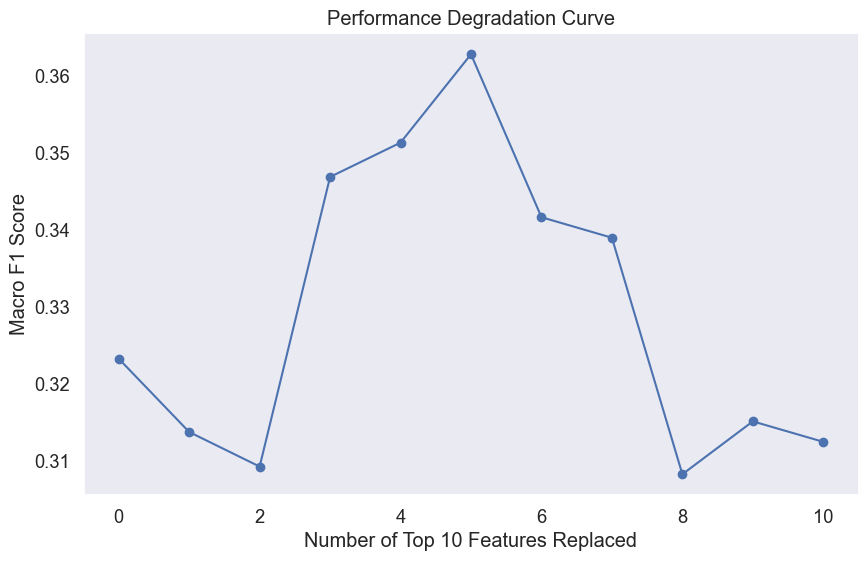

In [59]:
# Plot the performance degradation curve
plt.figure(figsize=(10, 6))
plt.plot(range(len(f1_scores_logit_smote)), f1_scores_logit_smote, marker='o')
plt.title('Performance Degradation Curve')
plt.xlabel('Number of Top 10 Features Replaced')
plt.ylabel('Macro F1 Score')
plt.grid(False)


Performance Degradation After Top 10 - Logit + SMOTE f1 macro score: 0.31244904800907874

Performance Degradation After Top 10 - Logit + SMOTE precision macro score: 0.3614790535938008

Performance Degradation After Top 10 - Logit + SMOTE recall macro score: 0.3372041333604243

Performance Degradation After Top 10 - Logit + SMOTE balanced accuracy score: 0.3372041333604243

Performance Degradation After Top 10 - Logit + SMOTE accuracy score: 0.49586065563016435

Performance Degradation After Top 10 - Logit + SMOTE cohen kappa score: 0.010083350726510343

Classification Report:

              precision    recall  f1-score   support

           3       0.17      0.00      0.00     36280
           4       0.54      0.75      0.62    202822
           5       0.38      0.27      0.31    141997

    accuracy                           0.50    381099
   macro avg       0.36      0.34      0.31    381099
weighted avg       0.44      0.50      0.45    381099




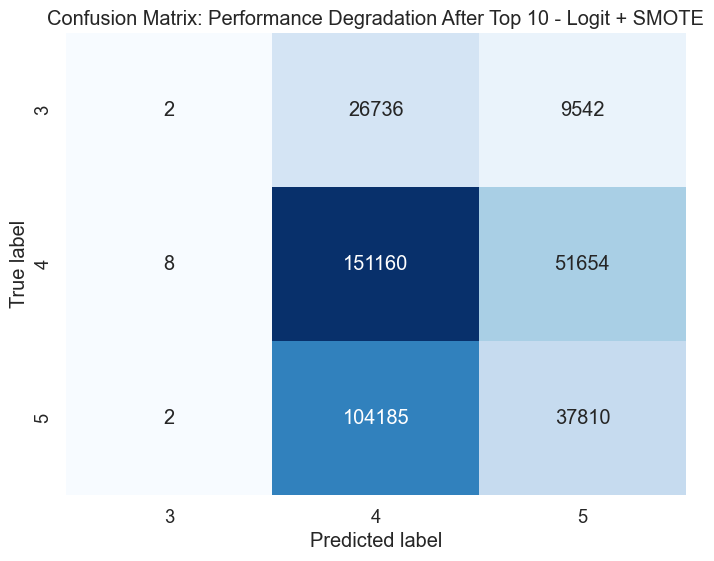

In [60]:
# After removing Top 6 Features Logit behaves like a Dummy Classifier
conf_matrix_classif_report('Performance Degradation After Top 10 - Logit + SMOTE', y_test, month_pred)

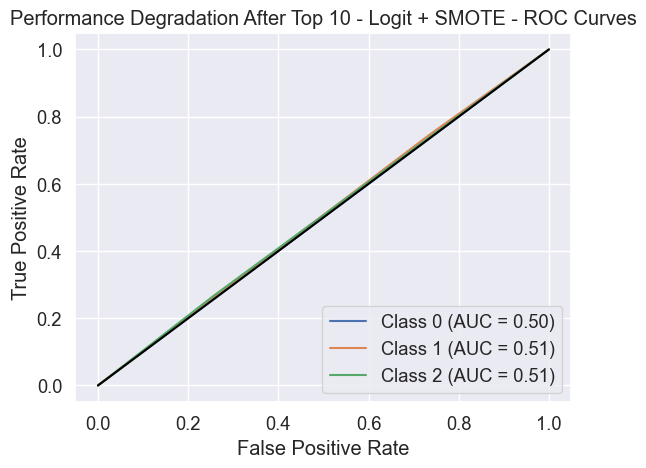

In [61]:
# After removing Top 6 Features Logit behaves like a Dummy Classifier
roc_curves("Performance Degradation After Top 10 - Logit + SMOTE", y_train_resampled, y_test, month_pred) 

In [56]:
tune_logit_f1_deg = [0.2535473794186183,
 0.25672725957877923,
 0.23570651667379286,
 0.2361648792693994,
 0.23190167497796563,
 0.23181192222748515,
 0.23157691427280117,
 0.2315632879561904,
 0.2315632879561904,
 0.2315632879561904,
 0.2315632879561904]
 
tune_logit_smote_f1_deg = [0.32325892116583527,
 0.31372813160843066,
 0.3092310804828797,
 0.34689689449753275,
 0.3513562954673115,
 0.36284967445896393,
 0.34165704789759005,
 0.33899004941750754,
 0.3082329333436049,
 0.31510903165119447,
 0.31244904800907874]


# Create Performance degradation graph tuned Logit with(out) SMOTE
graph_perf_deg_logit_df =  pd.DataFrame(list(zip(tune_logit_f1_deg, tune_logit_smote_f1_deg)),
              columns=['Tune Logit','Tune Logit + SMOTE'])

In [57]:
graph_perf_deg_logit_df

,Tune Logit,Tune Logit + SMOTE
0,0.253547,0.323259
1,0.256727,0.313728
2,0.235707,0.309231
3,0.236165,0.346897
4,0.231902,0.351356
5,0.231812,0.362850
6,0.231577,0.341657
7,0.231563,0.338990
8,0.231563,0.308233
9,0.231563,0.315109


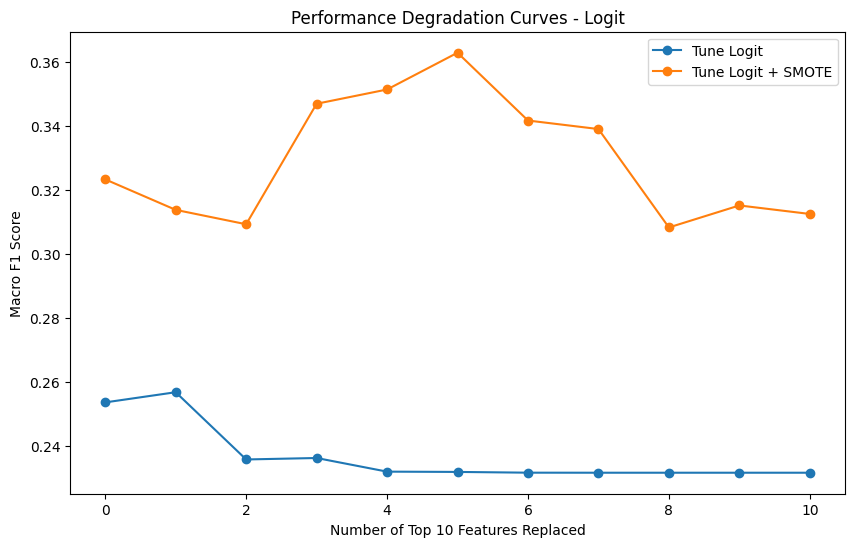

In [58]:
# Plot the performance degradation curve
fig = plt.figure(figsize=(10, 6))

# Plot each performance degradation curve and graph_perf_deg_logit_df add col_name to the legend
for column in graph_perf_deg_logit_df.columns:
    plt.plot(range(graph_perf_deg_logit_df.shape[0]), graph_perf_deg_logit_df[column], marker='o', label=column)

plt.title('Performance Degradation Curves - Logit')
plt.xlabel('Number of Top 10 Features Replaced')
plt.ylabel('Macro F1 Score')
plt.grid(False)
plt.legend()
plt.show()

In [59]:
fig.savefig('performance_degra_tune_logit.pdf')

In [1]:
import numpy as np
import pandas as pd

# Manually creating dataframe to prevent from re-running predictions
graph_perf_deg_logit = {
    'Tune Logit': [0.253547, 0.256727, 0.235707, 0.236165, 0.231902, 0.231812, 0.231577, 0.231563, 0.231563, 0.231563, 0.231563],
    'Tune Logit + SMOTE': [0.323259, 0.313728, 0.309231, 0.346897, 0.351356, 0.362850, 0.341657, 0.338990, 0.308233, 0.315109, 0.312449]
}

graph_perf_deg_logit_df = pd.DataFrame(graph_perf_deg_logit)

# Calculate the Performance degradation AUC using the trapezoidal rule
auc_tune_logit = np.trapz(graph_perf_deg_logit_df['Tune Logit'])
auc_tune_logit_smote = np.trapz(graph_perf_deg_logit_df['Tune Logit + SMOTE'])

print(f"Performance degradation AUC for Tune Logit: {auc_tune_logit}")
print(f"Performance degradation AUC for Tune Logit + SMOTE: {auc_tune_logit_smote}")


Performance degradation AUC for Tune Logit: 2.361134
Performance degradation AUC for Tune Logit + SMOTE: 3.305905


### LIME with SMOTE

In [46]:
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=sub_X_train,
    training_labels=sub_y_train,
    feature_names=model_feature_names,
    class_names=['3', '4','5'],
    mode='classification'
)

In [47]:
sub_X_test_df = pd.DataFrame(sub_X_test,columns=model_feature_names)

In [48]:
exp_lime = explainer_lime.explain_instance(
    data_row=sub_X_test_df.iloc[1], 
    predict_fn=tune_logit_smote.predict_proba, 
    num_features=10
)

exp_lime.show_in_notebook(show_table=True)
exp_lime.save_to_file('tune_logit_smote_lime_local.html')

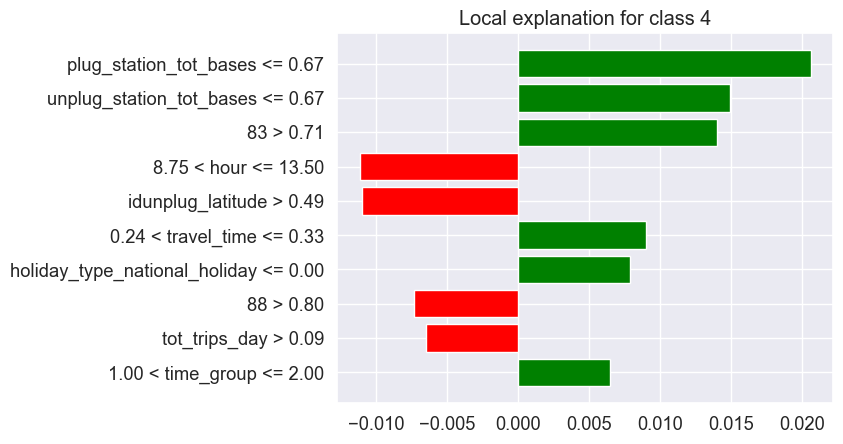

In [49]:
figure = exp_lime.as_pyplot_figure(label = exp_lime.available_labels()[0])

In [50]:
# Using SP-LIME to return explanations on a sample data set 
# to obtain a non-redundant global decision perspective of the base model
sp_exp_lime = submodular_pick.SubmodularPick(explainer_lime, 
                                        sub_X_test,
                                        predict_fn=tune_logit_smote.predict_proba,
                                        num_features=5,
                                        num_exps_desired=5)

In [51]:
# Global Interpretability on subset instances
for i, exp in enumerate(sp_exp_lime.sp_explanations):
    # Plot results
    exp_lime.show_in_notebook()

    # Save the results as html
    file_name = f'tune_logit_smote_global_lime_explanation_{i}.html'
    exp.save_to_file(file_name)
    print(f"Explanation saved to {file_name}")

print('SP-LIME Explanations for Tune Logit with SMOTE.')


Explanation saved to tune_logit_smote_global_lime_explanation_0.html


Explanation saved to tune_logit_smote_global_lime_explanation_1.html


Explanation saved to tune_logit_smote_global_lime_explanation_2.html


Explanation saved to tune_logit_smote_global_lime_explanation_3.html


Explanation saved to tune_logit_smote_global_lime_explanation_4.html
SP-LIME Explanations for Tune Logit with SMOTE.


SP-LIME with SMOTE Local Explanations


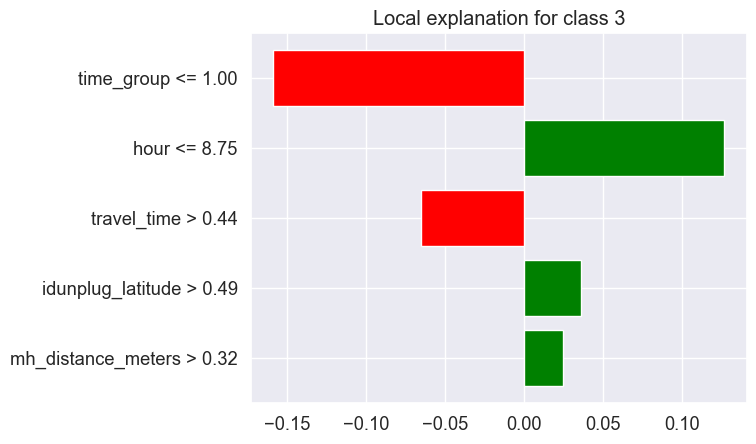

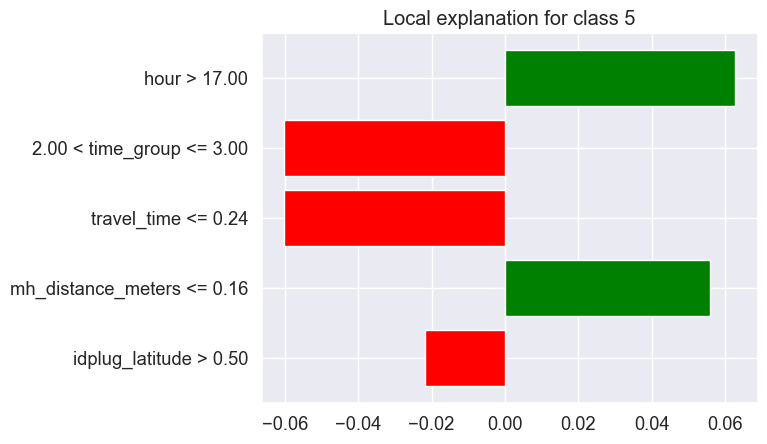

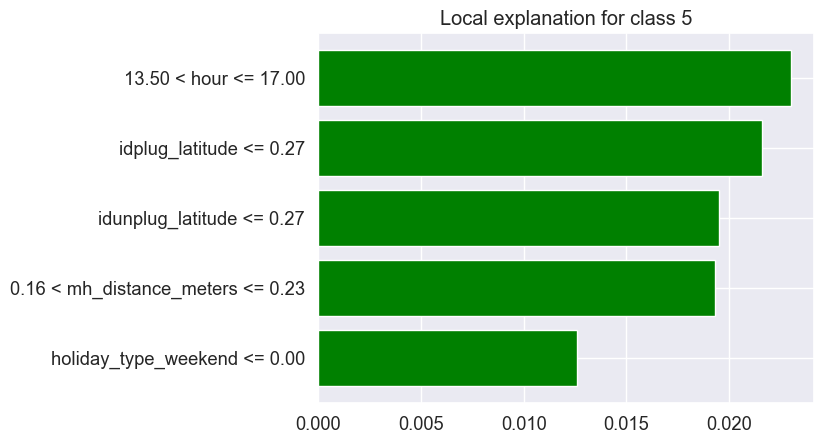

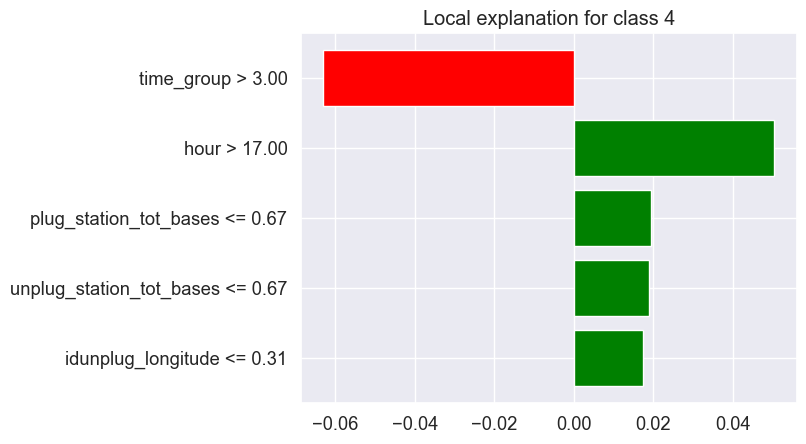

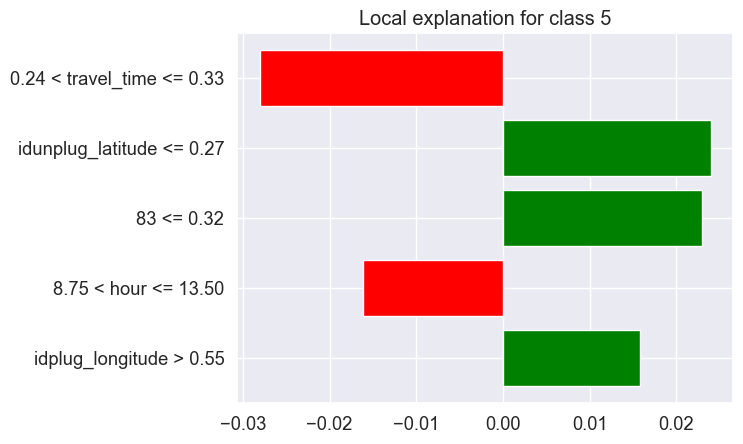

In [52]:
# Global Interpretability on subset instances
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_exp_lime.sp_explanations]
print('SP-LIME with SMOTE Local Explanations')